<a href="https://colab.research.google.com/github/yraj1996/Credit_card_default_prediction/blob/main/Credit_card_defaut_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - 



##### **Project Type**    - Classification
##### **Contribution**    - Individual
##### **Name** - Yash Raj

# **Project Summary -**

The aim of a credit card default prediction project is to develop a machine learning model that can accurately predict which credit card users are likely to default on their payments in the future. The model should use historical data of credit card users such as their payment history, credit limit, age, education, and other demographic information to identify patterns and trends that can help predict default behavior. The project focuses on utilizing historical data of Customer's default payment in Taiwan.


The purpose of this project is to conduct quantitative analysis on credit card default risk by using 3 machine learning models with accessible customer data, instead of credit score or credit history, with the goal of assisting and speeding up the human decision making process.

Our project is divided into several parts :

* The first stage is to underatand the dataset that involves data inspection which included first view of data,looking for missing values and duplicate values.
* The next stage involved exploratory data analysis, where trends and patterns in the data were identified. Distribution of data was also studied.
* Hypothesis Testing was performed.
* After this Feature selection and Preprocessing of data was done by converting categorical variables into numerical ones, splitting data, data scaling and also handle the imbalance data.
* Furthur, various machine learning algorithms were tested on the split data that is trainig and test dataset, including Logistic regression, Random Forest Classifier and XGBOOST classifier.
* In the last part we evaluate the evaluation metrics of each algorithm and implement the machine learning algorithm  with better scores. 

Some of following insights are:
* There were **30000 records and 25 attributes** in the dataset. 
* In feature engineering we transformed raw data into a more useful and informative form, by encoding, feature manipulation, and feature selection. We handled target class imbalance using **SMOTE**.
* When implementing a machine learning model, We focused more on the Recall score and F1 score because we are dealing with credit card data and our data is unbalanced.
* After comparing all the metrices like Recall and f1 score, I found out XGBOOST classifier is most suitabe machine earning alogrithm for this business problem.

Overall Credit card default prediction demonstrate the best use of machine learning algorithm in predicting the number of defaulters in banking sector.

# **GitHub Link -**

https://github.com/yraj1996/Credit_card_default_prediction

# **Problem Statement**


In recent years, the credit card issuers in Taiwan faced the cash and credit card debt crisis and the delinquency is expected to peak in upcoming quater. In order to increase market share, card-issuing banks in Taiwan over-issued cash and credit cards to unqualified applicants. At the same time, most cardholders, irrespective of their repayment ability, overused credit card for consumption and accumulated heavy credit and cash–card debts. The crisis caused the blow to consumer finance confidence and it is a big challenge for both banks and cardholders.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries and modules

# libraries that are used for analysis and visualization
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# libraries to do statistical analysis
import math
from scipy.stats import *

# libraries used to pre-process
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# libraries used to implement models
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier



# libraries to evaluate performance
import sklearn.metrics as metrics
from sklearn.metrics import auc, accuracy_score, roc_auc_score, roc_curve, confusion_matrix
from sklearn.metrics import precision_score, f1_score, recall_score
from sklearn.metrics import classification_report, ConfusionMatrixDisplay

# library of warnings would assist in ignoring warnings issued
import warnings
warnings.filterwarnings("ignore")

# to set max column display
pd.pandas.set_option('display.max_columns',None)

### Dataset Loading

In [ ]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df=pd.read_csv('/content/drive/MyDrive/ALMA BETTER Capstone Project/Credit card/Copy of default of credit card clients.csv')

In [ ]:
pd.set_option('display.max_columns', None)

### Dataset First View

In [ ]:
# Dataset First Look
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
df.shape

(30000, 25)

### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
len(df[df.duplicated()])

0

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default payment next month    0
dtype: int64

<Axes: >

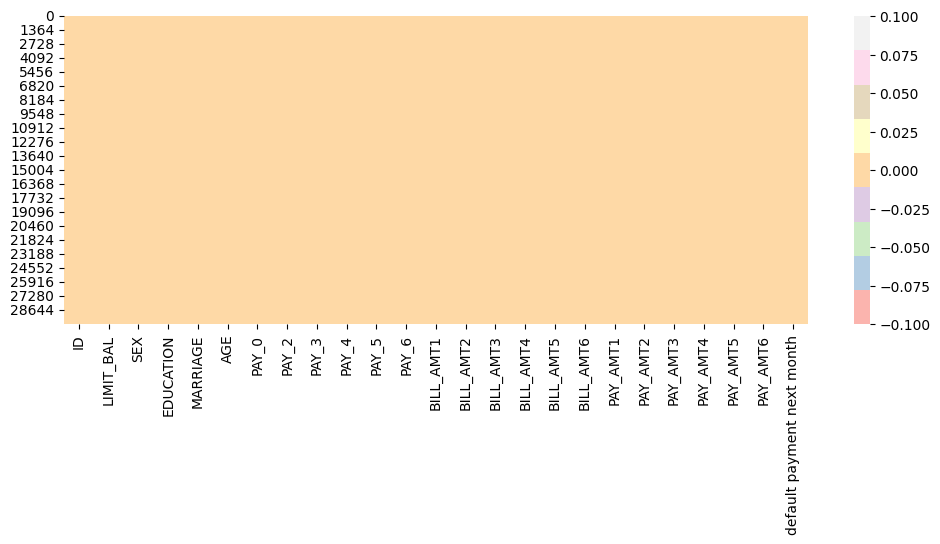

In [ ]:
# Visualizing the missing values
plt.figure(figsize=(12,4))
sns.heatmap(df.isna(),cmap='Pastel1')

From the above heatmap, we noticed that every column has 0 null values.

### What did you know about your dataset?

The dataset given is a dataset from banking industry, and we have to analysis on credit card default risk and the insights behind it.

* There are 30000 rows and 25 columns in the dataset. 
* The dataset does not contain any duplicate or missing values.

Default risk is the risk a lender takes that a borrower will not make the required payments on a debt obligation, such as a loan, a bond, or a credit card. Lenders and investors are exposed to default risk in virtually all forms of credit offerings.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns

df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


### Variables Description 


* ID: ID of each client
* LIMIT_BAL: Amount of given credit in NT dollars (includes individual and family/supplementary credit
* SEX: Gender (1=male, 2=female)
* EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
* MARRIAGE: Marital status (1=married, 2=single, 3=others)
* AGE: Age in years
* PAY_0: Repayment status in September, 2005 (-1=pay duly, 1=payment delay for one month, 2=payment delay for two months,8=payment delay for eight months, 9=payment delay for nine months and above)
* PAY_2: Repayment status in August, 2005 (scale same as above)
* PAY_3: Repayment status in July, 2005 (scale same as above)
* PAY_4: Repayment status in June, 2005 (scale same as above)
* PAY_5: Repayment status in May, 2005 (scale same as above)
* PAY_6: Repayment status in April, 2005 (scale same as above)
* BILL_AMT1: Amount of bill statement in September, 2005 (NT dollar)
* BILL_AMT2: Amount of bill statement in August, 2005 (NT dollar)
* BILL_AMT3: Amount of bill statement in July, 2005 (NT dollar)
* BILL_AMT4: Amount of bill statement in June, 2005 (NT dollar)
* BILL_AMT5: Amount of bill statement in May, 2005 (NT dollar)
* BILL_AMT6: Amount of bill statement in April, 2005 (NT dollar)
* PAY_AMT1: Amount of previous payment in September, 2005 (NT dollar)
* PAY_AMT2: Amount of previous payment in August, 2005 (NT dollar)
* PAY_AMT3: Amount of previous payment in July, 2005 (NT dollar)
* PAY_AMT4: Amount of previous payment in June, 2005 (NT dollar)
* PAY_AMT5: Amount of previous payment in May, 2005 (NT dollar)
* PAY_AMT6: Amount of previous payment in April, 2005 (NT dollar)
* default.payment.next.month: Default payment (1=yes, 0=no)

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
df.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default payment next month        2
dtype: int64

In [ ]:
#category wise values
df['MARRIAGE'].value_counts()

2    15964
1    13659
3      323
0       54
Name: MARRIAGE, dtype: int64

MARRIAGE: Marital status (1=married, 2=single, 3=others)

In [ ]:
#category wise values
df['EDUCATION'].value_counts()

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64

EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Changing inconsistent column names "PAY_0" to 'PAY_1', 'default.payment.next.month'to 'Is_Defaulter'
df.rename(columns={'PAY_0':'PAY_1','default payment next month':'Is_Defaulter'},inplace = True)
df.columns
     

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_1',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'Is_Defaulter'],
      dtype='object')

In [ ]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Is_Defaulter
0,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [ ]:
#creating New feature [Sum of all pay amount] by adding all paid amount.
df['Sum_all_pay_amount'] = df['PAY_AMT1']+df['PAY_AMT2']+df['PAY_AMT3']+df['PAY_AMT4']+df['PAY_AMT5']+df['PAY_AMT6']

In [ ]:
#creating New feature [Sum of all bill] by adding all bill amount.
df['Sum_all_bill'] = df['BILL_AMT1']+df['BILL_AMT2']+df['BILL_AMT3']+df['BILL_AMT4']+df['BILL_AMT5']+df['BILL_AMT6']

In [ ]:
#counting values of defaulter and non-defaulter.
df['Is_Defaulter'].value_counts()

0    23364
1     6636
Name: Is_Defaulter, dtype: int64

In [ ]:
#adding up other sub-features of EDUCATION in single sub_feature.
fil = (df['EDUCATION'] == 5) | (df['EDUCATION'] == 6) | (df['EDUCATION'] == 0)
df.loc[fil, 'EDUCATION'] = 4
df['EDUCATION'].value_counts()

2    14030
1    10585
3     4917
4      468
Name: EDUCATION, dtype: int64

### What all manipulations have you done and insights you found?

* In this section, I create two new features from existing features for further data analysis.
* Previously, EDUCATION feature has 4 sub-features like 1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown. So I conclude three sub-features which are unknown and others in single value.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Is_Defaulter

Text(0.5, 1.0, 'Percentage of Default and Non-Default Payment')

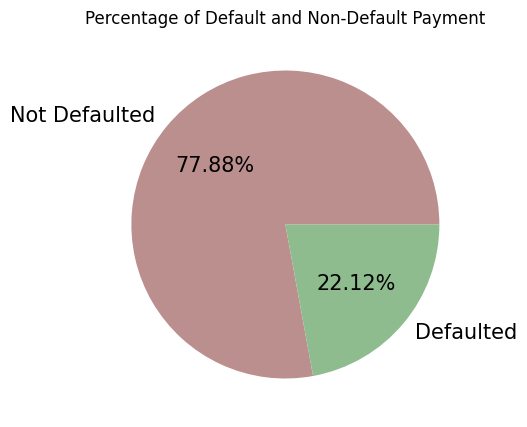

In [ ]:
# Chart - 1 visualization code
plt.figure(figsize=(10,5))
plt.pie(df['Is_Defaulter'].value_counts(),labels=['Not Defaulted','Defaulted'],textprops={"fontsize":15},colors=['rosybrown', 'darkseagreen'],autopct='%2.2f%%')
plt.title('Percentage of Default and Non-Default Payment')

Text(0.5, 0, 'Is_Defaulter  0:No   1: Yes')

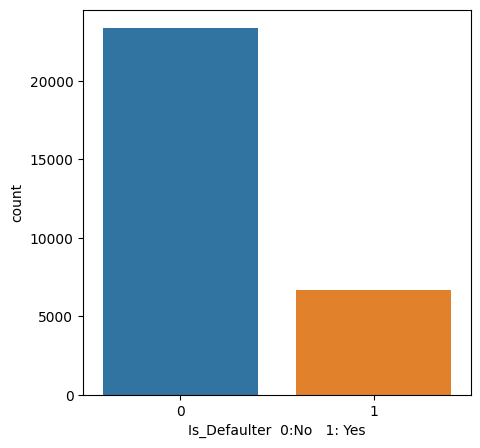

In [ ]:
plt.figure(figsize=(5,5))
sns.countplot(x = 'Is_Defaulter', data = df)
plt.xlabel('Is_Defaulter  0:No   1: Yes')

##### 1. Why did you pick the specific chart?

I pick bargraph and pie chart for visualization. 

A bar chart or bar graph is a chart or graph that presents categorical data with rectangular bars with heights or lengths proportional to the values that they represent. A bar chart is used when you want to show a distribution of data points or perform a comparison of metric values across different subgroups of your data.

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through area covered in a circle with different colors. Where differenet percentage comparison comes into action pie chart is used frequently.

##### 2. What is/are the insight(s) found from the chart?

We can observe from the bar graph that number of default payment is less in comparison of no default payment still  number of default paymen is higher than 5000.

By percentage 22.1% of customers defaulted on their payment whereas 77.9% of customers do not default on their credit card payment.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

 A credit card default happens when you fail to make any payment towards your credit card outstanding bill for a long period of time.

This is just count plot to visualize how much defaulted and non defaulted payment we got. It might be helpful for business to understand the percentage of default payment.

####  Limit balance

##### Univariate 

Text(0.5, 1.0, 'Limit Balance')

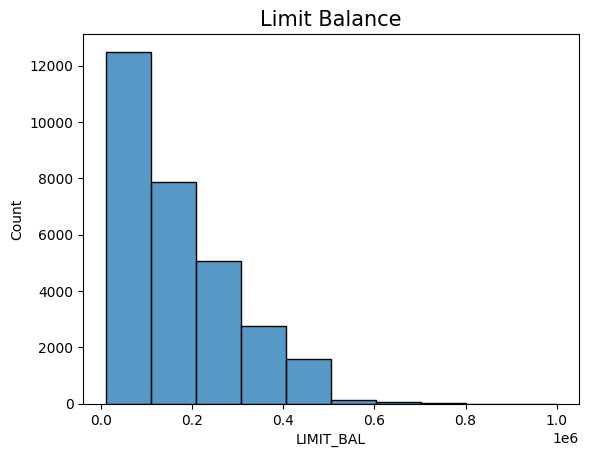

In [ ]:
#Distribution of limit blance.
hist = sns.histplot(df['LIMIT_BAL'],bins=10)
hist.set_title('Limit Balance', size=15)

##### Bivariate

Text(0.5, 0, 'Is_Defaulter  0:No   1: Yes')

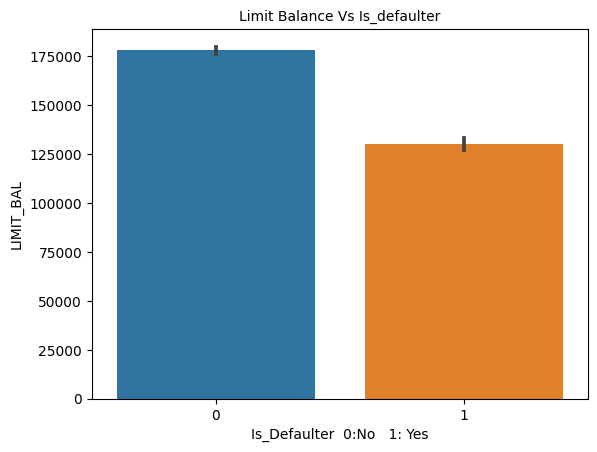

In [ ]:
# Bi-variate analysis
# Limit Balance Vs Default Payment
bar=sns.barplot(y='LIMIT_BAL', x='Is_Defaulter', data=df)
bar.set_title('Limit Balance Vs Is_defaulter', size=10)
plt.xlabel('Is_Defaulter  0:No   1: Yes')

Text(0.5, 0, 'EDUCATION')

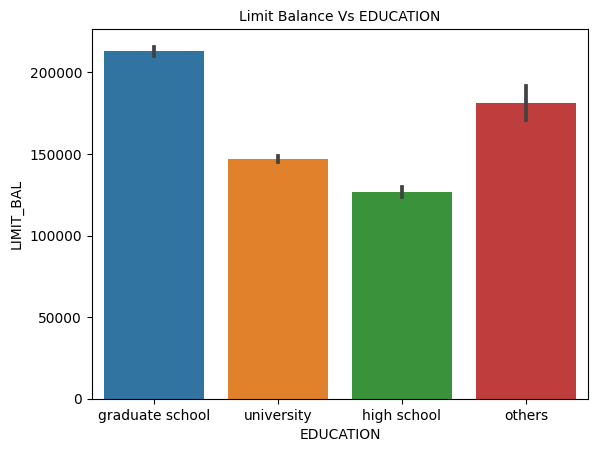

In [ ]:
bar = sns.barplot(data=df, x='EDUCATION', y='LIMIT_BAL')
bar.set_title('Limit Balance Vs EDUCATION', size=10)
bar.set_xticklabels(['graduate school','university', 'high school',  'others'])
plt.xlabel('EDUCATION')

##### Multivariate 

Text(0.5, 0, 'SEX  1:Male  2:Female')

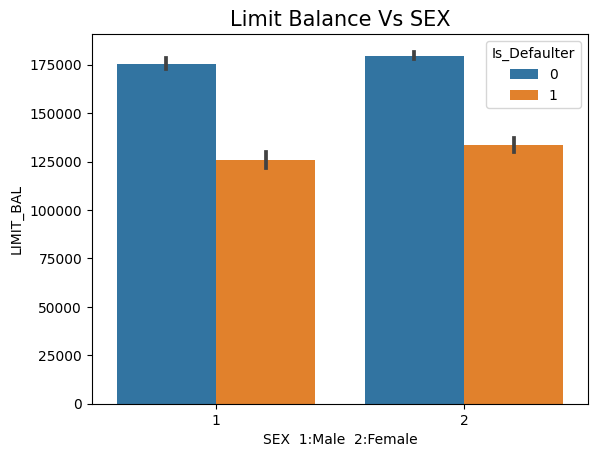

In [ ]:
bar = sns.barplot(data=df, x='SEX', y='LIMIT_BAL',hue='Is_Defaulter')
bar.set_title('Limit Balance Vs SEX', size=15)
plt.xlabel('SEX  1:Male  2:Female')

##### 1. Why did you pick the specific chart?

A bar chart or bar graph is a chart or graph that presents categorical data with rectangular bars with heights or lengths proportional to the values that they represent.So, I pick a bar graph to perform a comparison of metric values across different subgroups.

##### 2. What is/are the insight(s) found from the chart?

* Most of the customers get up to 2 lakhs of credit limit balance.
* On average females gets more limit than males.
* For graduate school credit is more in comparison to others.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

The balance-to-limit ratio measures the amount of credit being used compared to the total credit available to a borrower. 

More credit card defualt for limit balance about 100000. It might mean that credit card might be too easy to be issued for people who have low credit scores.

#### Gender (Univariate and Bivariate)

Text(0.5, 0, 'SEX  1:Male  2:Female')

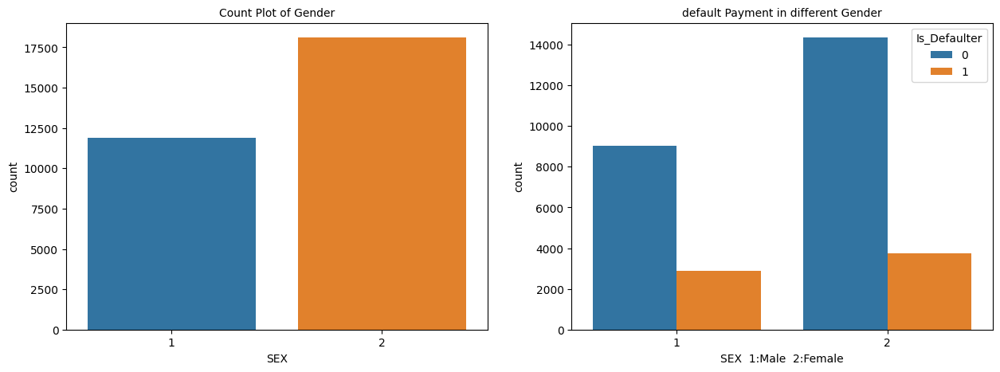

In [ ]:
#count plot for Gender and with respect to Is_Defaulter

fig,axes = plt.subplots(1,2, figsize=(15,5))
count = sns.countplot(data=df,x='SEX',ax=axes[0])
count.set_title('Count Plot of Gender', size=10)
plt.xlabel('SEX  1:Male  2:Female')

count1=sns.countplot(x = 'SEX', hue = 'Is_Defaulter',ax=axes[1], data = df)
count1.set_title('default Payment in different Gender', size=10)
plt.xlabel('SEX  1:Male  2:Female')

##### 1. Why did you pick the specific chart?

A bar chart or bar graph is a chart or graph that presents categorical data with rectangular bars with heights or lengths proportional to the values that they represent.So, I pick a bar graph to perform a comparison of metric values across different subgroups.

##### 2. What is/are the insight(s) found from the chart?

* The count of females are more than males in dataset
* female tend to have more defaults than male. 
* Females are the major user of credit cards.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Defaulter ratio is slmost same for both male and female but females account for using credit card more.
Females are the major revenue for credit cards. Banks need to create some new policies to reduce the defaults.

####  Education (Univariate and Bivariate)

Text(0.5, 1.0, 'default Payment in different Education')

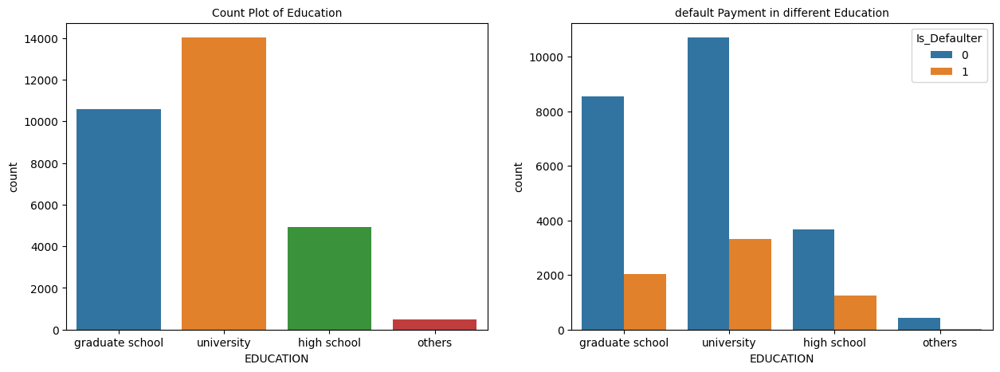

In [ ]:
#count plot for EDUCATION and with respect to Is_Defaulter
fig, axes = plt.subplots(1,2,figsize=(15,5))
count=sns.countplot(x = 'EDUCATION', ax = axes[0], data = df)
count1=sns.countplot(x = 'EDUCATION', hue = 'Is_Defaulter',ax = axes[1], data = df)
count.set_xticklabels(['graduate school','university', 'high school',  'others'])
count1.set_xticklabels(['graduate school','university', 'high school',  'others'])
count.set_title('Count Plot of Education', size=10)
count1.set_title('default Payment in different Education', size=10)

##### 1. Why did you pick the specific chart?

A bar chart or bar graph is a chart or graph that presents categorical data with rectangular bars with heights or lengths proportional to the values that they represent.So, I pick a bar graph to perform a comparison of metric values across different subgroups.

##### 2. What is/are the insight(s) found from the chart?

* from countplot we can see thatn  number of users is more from Universirty followed by graduate school and high schools.
* Number of deafaulter is more in University which is folowed by graduate school.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

From above graphs and plots we can see the disturbution of credit cards users in education sector. Credit card users in University students are quite high in comparison to others but defaulter ration in comparison to total users are more in High schools. Bank should make some restriction or rules regarding credit card users of high schools.

####  Marriage (Univariate and Bivariate)

[Text(0, 0, 'Others'),
 Text(1, 0, 'Married'),
 Text(2, 0, 'Single'),
 Text(3, 0, 'Divorce')]

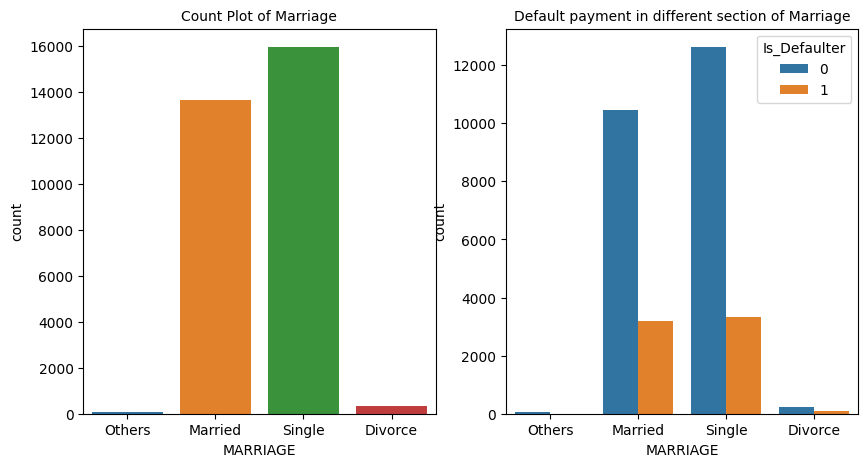

In [ ]:
#count plot for MARRIAGE and with respect to Is_Defaulter
fig, axes = plt.subplots(ncols=2,figsize=(10,5))
count=sns.countplot(x = 'MARRIAGE', ax = axes[0], data = df)
count1=sns.countplot(x = 'MARRIAGE', hue = 'Is_Defaulter',ax = axes[1], data = df)
count.set_title("Count Plot of Marriage",size=10)
count1.set_title("Default payment in different section of Marriage",size=10)
count1.set_xticklabels(['Others','Married','Single', 'Divorce'])
count.set_xticklabels(['Others','Married','Single', 'Divorce'])

##### 1. Why did you pick the specific chart?

A bar chart or bar graph is a chart or graph that presents categorical data with rectangular bars with heights or lengths proportional to the values that they represent.So, I pick a bar graph to perform a comparison of metric values across different subgroups.

##### 2. What is/are the insight(s) found from the chart?

* Unmarried people tend to have more credit cards than married but the difference is very significant.
* Number of defaulter is almost same among Married and single.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

From above insights, we can see that number of both married and single credit card users are same and they also have almost same number of defaulters but in comparison to others divorce users are tend to be become more defaulter.
Altough bank doesn't make policy on basis of married, un-married or divorce but they an keep eye on data of such users.

 #### Age (Univariate and Bivariate)

[Text(0.5, 1.0, 'Age Vs Default Payment'),
 Text(0, 0.5, 'Default Payments Count')]

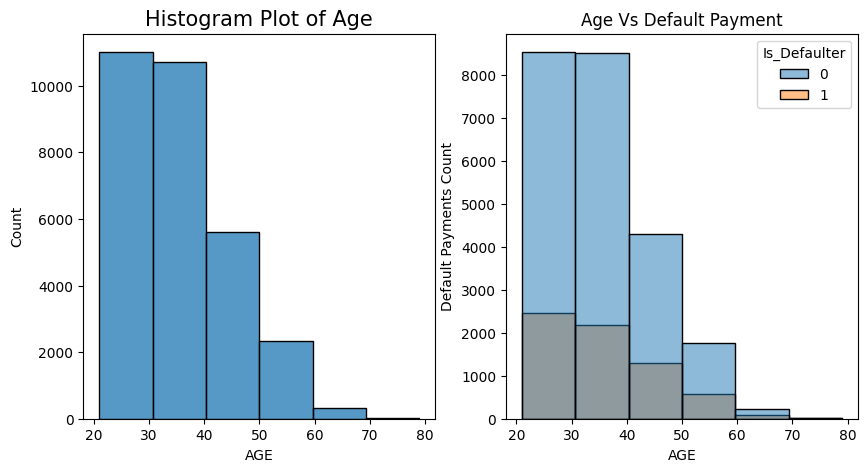

In [ ]:

fig, axes = plt.subplots(1,2,figsize=(10,5))
hist = sns.histplot(df['AGE'],bins=6, ax=axes[0])
hist.set_title('Histogram Plot of Age', size=15)

# Bi-variate
hist = sns.histplot(data=df, x='AGE', hue='Is_Defaulter', bins=6, ax=axes[1])
hist.set(title='Age Vs Default Payment',ylabel='Default Payments Count')


##### 1. Why did you pick the specific chart?

The histogram is a popular graphing tool. It is used to summarize discrete or continuous data that are measured on an interval scale. 

##### 2. What is/are the insight(s) found from the chart?

* Most of the customers belong to the 20-30 year age group followed by the 30-40 age group.
* With an increase in the age group the count of default payments decreases.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

From above insight and graphs we can see that number of credit user are between 20-40 years. As the users number is very high ,number of defaulter is also high in this age segment.
But we look at the ratio of defaulters who has age more than 40, ratio of defaulters are high that means old people are more prone to become defaulter. Banks should initiate some regulations to check the limit balance and credit risk among old people.

#### Repayment status

**-1=pay duly, 1=payment delay for one month, 2=payment delay for two months,8=payment delay for eight months, 9=payment delay for nine months and above**

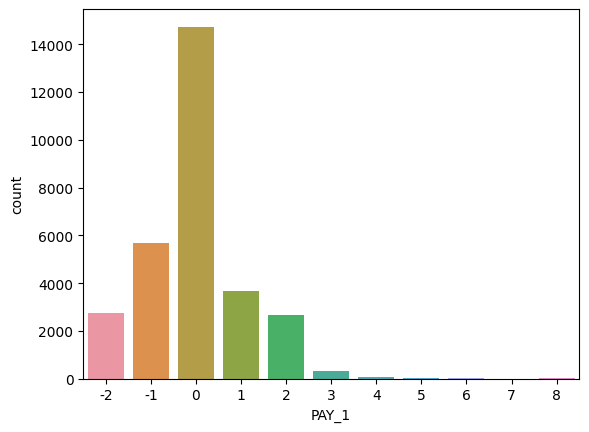

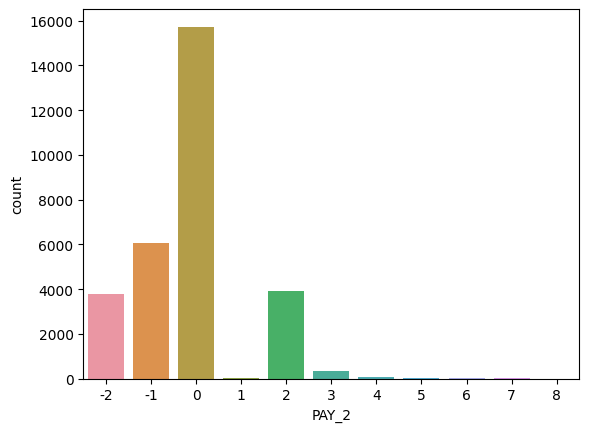

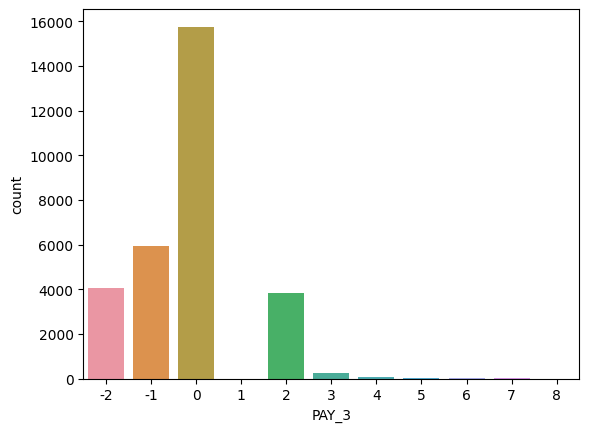

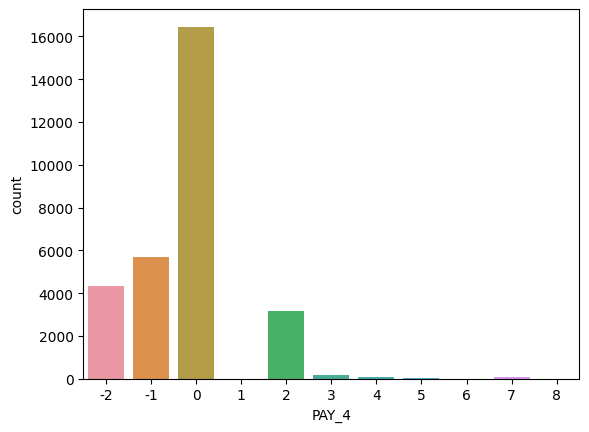

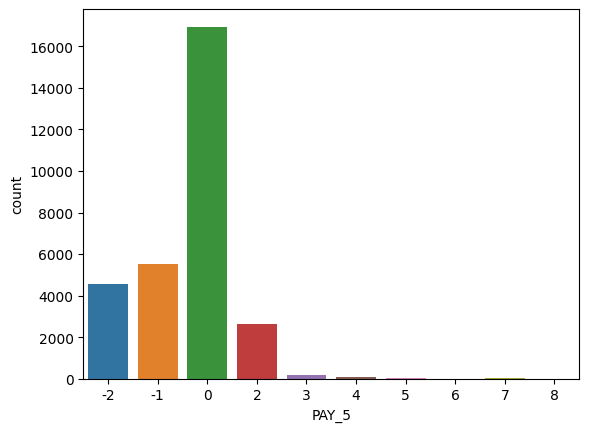

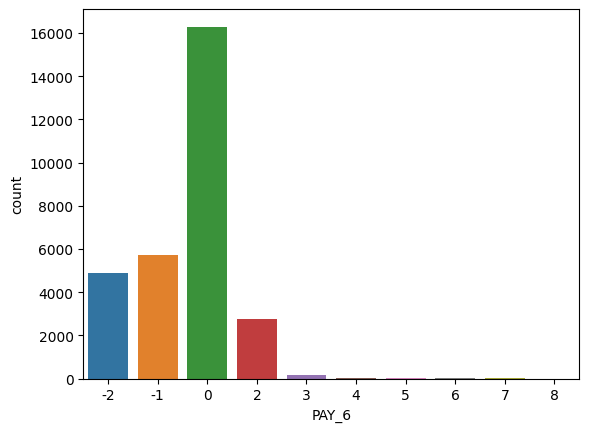

In [ ]:
# Repayment status countplots.
Repayment_status=['PAY_1','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']
for i in Repayment_status:
  plt.subplots
  sns.countplot(data=df,x=i)
  plt.show()

##### 1. Why did you pick the specific chart?

A bar chart or bar graph is a chart or graph that presents categorical data with rectangular bars with heights or lengths proportional to the values that they represent.So, I pick a bar graph to perform a comparison of metric values across different subgroups.

##### 2. What is/are the insight(s) found from the chart?

* Most of the payments are paid duly. 
* Customers with payment delay in all the payment history have the most number in 2-month payment delay means a 2-month payment delay is a critical sign of the default of the payment.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Although most of users paid their dues on time, there are some propertion of users who had payment dealy for 2 months and in very few numbers users had payment dealy goes for 8 or 9 months.
Bank should try to facilitate some type of penalty on these kind of delay of payment.

#### Bill Amount

Text(0.5, 1.0, 'Bill amount Vs Default Payment Count')

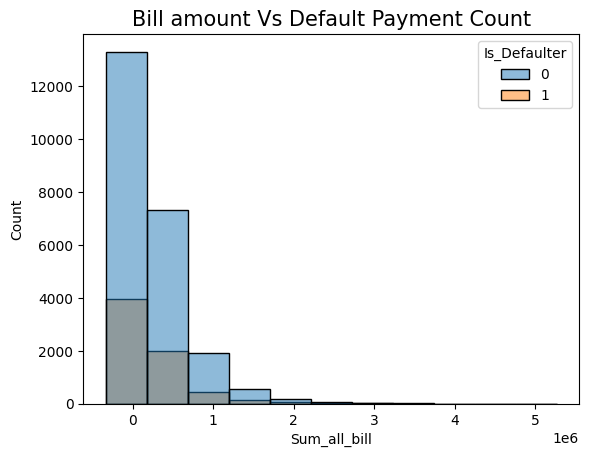

In [ ]:
# Chart - 8 visualization code
hist = sns.histplot(data=df, x='Sum_all_bill', hue='Is_Defaulter',bins=11)
hist.set_title('Bill amount Vs Default Payment Count', size=15)

##### 1. Why did you pick the specific chart?

The histogram  is used to summarize discrete or continuous data that are measured on an interval scale.

##### 2. What is/are the insight(s) found from the chart?

* Most of the defaults are from customers who have up to 2 lakh bill amount on an average in the last 6 months.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

This is simple disturbution chart of total bill amount. It's just giving a overview regarding proportion of defaulter in resepect with total bill amount.
more the bill amount the more the number of defulter.

#### PayAmount

Text(0.5, 1.0, 'pay_amount Vs Default Payment Count')

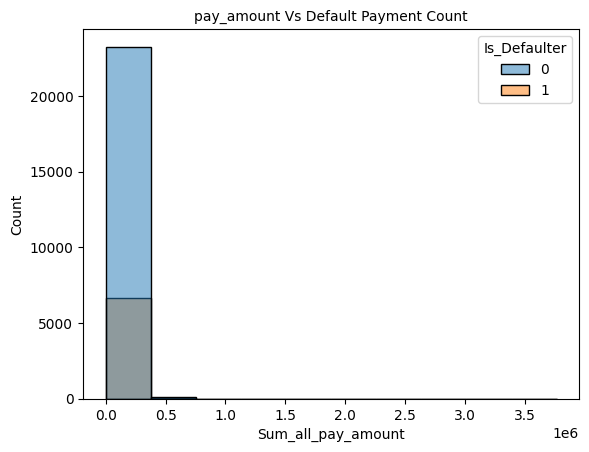

In [ ]:
# Chart - 9 visualization code
hist = sns.histplot(data=df, x='Sum_all_pay_amount', hue='Is_Defaulter',bins=10)
hist.set_title('pay_amount Vs Default Payment Count', size=10)

##### 1. Why did you pick the specific chart?

The histogram is used to summarize discrete or continuous data that are measured on an interval scale.

##### 2. What is/are the insight(s) found from the chart?

* In  the pay amounts most of the paid amount is up above 20000.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

This is simple disturbution chart of total Paid amount. It's just giving a overview regarding proportion of defaulter in resepect with total Paid amount. 

#### Chart - 14 - Correlation Heatmap

Text(0.5, 1.0, 'Heatmap')

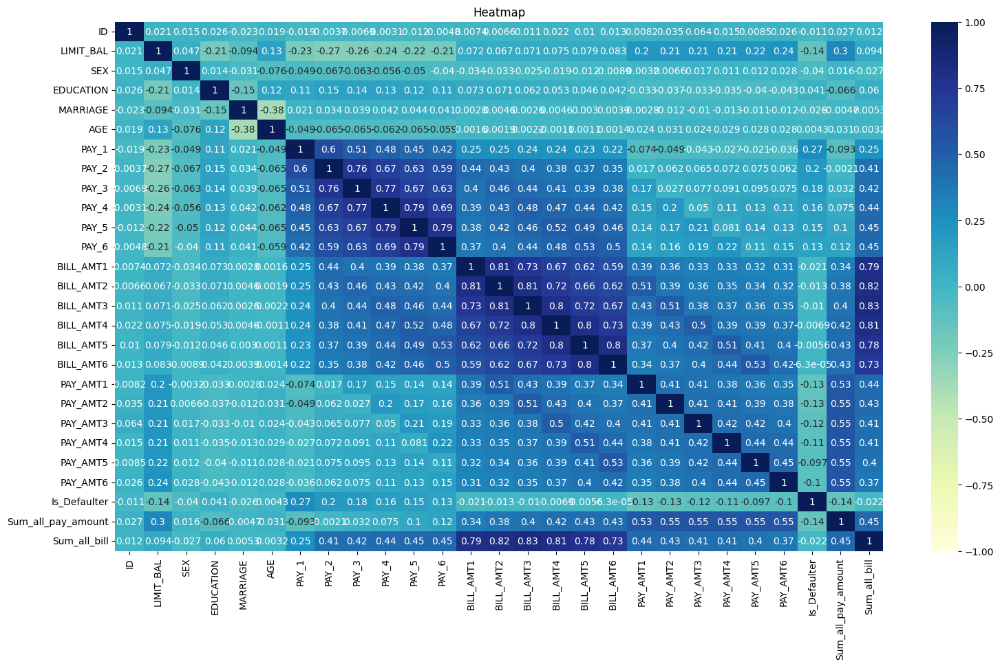

In [ ]:
# Correlation Heatmap visualization code
plt.figure(figsize=(18,10))
sns.heatmap(df.astype(float).corr(method='kendall'), cmap="YlGnBu", annot=True,vmin=-1,vmax=1)
plt.title('Heatmap')

##### 1. Why did you pick the specific chart?

A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. A correlation matrix is used to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses.

Thus to know the correlation between all the variables along with the correlation coeficients, i used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

There is not strong correlation between fetures except bill amount and payment amount.

#### Chart - 15 - Pair Plot 

<Figure size 2000x1000 with 0 Axes>

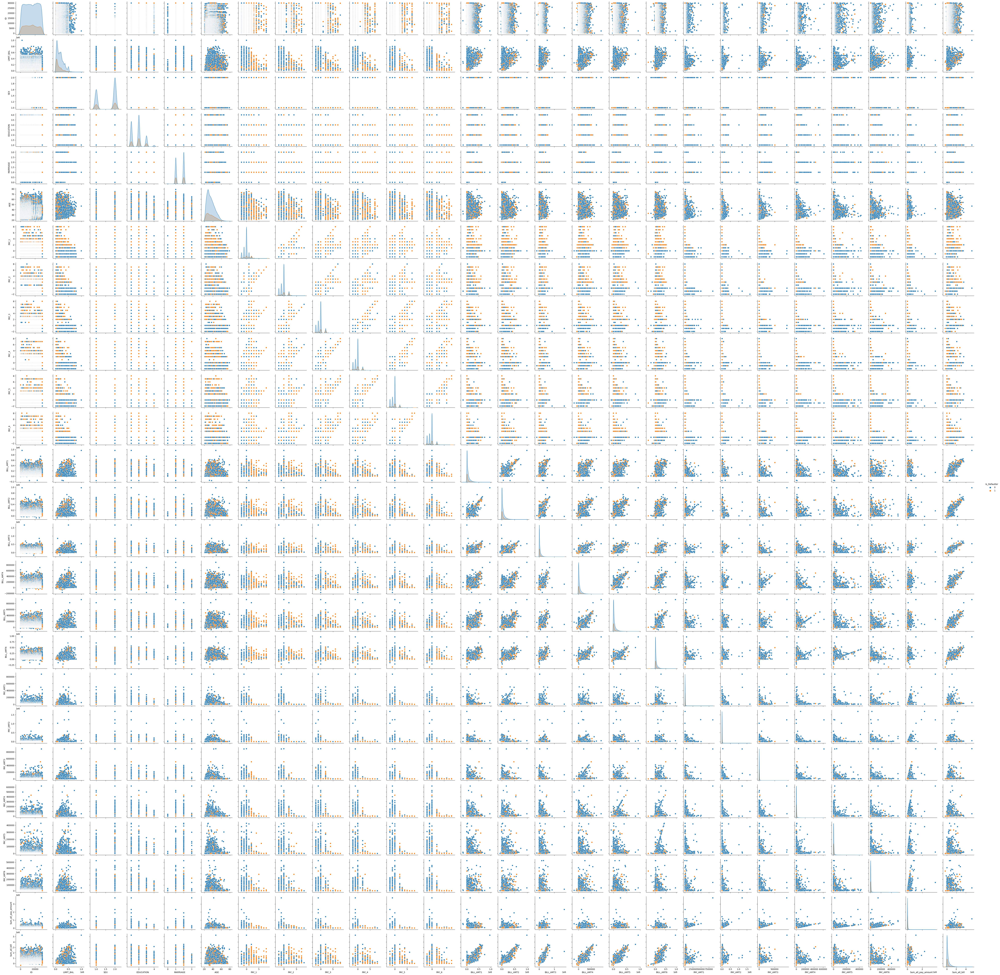

In [ ]:
# Pair Plot visualization code
plt.figure(figsize=(20,10))
sns.pairplot(df,hue='Is_Defaulter')

##### 1. Why did you pick the specific chart?

Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters. It also helps to form some simple classification models by drawing some simple lines or make linear separation in our data-set.

Thus, I used pair plot to analyse the patterns of data and realationship between the features. It's exactly same as the correlation map but here you will get the graphical representation.

##### 2. What is/are the insight(s) found from the chart?

There are positive relationship among bill amounts and pay amounts.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

In [ ]:
# Creating Parameter Class 
class findz:
  def proportion(self,sample,hyp,size):
    return (sample - hyp)/math.sqrt(hyp*(1-hyp)/size)
  def mean(self,hyp,sample,size,std):
    return (sample - hyp)*math.sqrt(size)/std
  def varience(self,hyp,sample,size):
    return (size-1)*sample/hyp

variance = lambda x : sum([(i - np.mean(x))**2 for i in x])/(len(x)-1)
zcdf = lambda x: norm(0,1).cdf(x)
# Creating a function for getting P value
def p_value(z,tailed,t,hypothesis_number,df,col):
  if t!="true":
    z=zcdf(z)
    if tailed=='l':
      return z
    elif tailed == 'r':
      return 1-z
    elif tailed == 'd':
      if z>0.5:
        return 2*(1-z)
      else:
        return 2*z
    else:
      return np.nan
  else:
    z,p_value=stats.ttest_1samp(df[col],hypothesis_number)
    return p_value
    
  
# Conclusion about the P - Value
def conclusion(p):
  significance_level = 0.05
  if p>significance_level:
    return f"Failed to reject the Null Hypothesis for p = {p}."
  else:
    return f"Null Hypothesis rejected Successfully for p = {p}"

# Initializing the class
findz = findz()

3 Hypothetical statements are:

1. Customers defaulting have limit balance less than 100000
2. Customers defaulting have total last bill amount of 50000.
3. Men not defaulting are more than or equal to 30 years of AGE. 

### Hypothetical Statement - 1

**Customers defaulting have limit balance less than 100000**

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 100000

Alternate Hypothesis : N > 100000

Test Type: Right Tailed Test

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

# Is_Defaulter:
# 0 = non-default; 1 = default
hypo_2=df[(df["Is_Defaulter"]==1)]

# Getting the required parameter values for hypothesis testing
hypothesis_number = 100000
sample_mean = hypo_2["LIMIT_BAL"].mean()
size = len(hypo_2)
std=(variance(hypo_2["LIMIT_BAL"]))**0.5


In [ ]:
# Getting Z value
z = findz.mean(hypothesis_number,sample_mean,size,std)

# Getting P - Value
p = p_value(z=z,tailed='r',t="true",hypothesis_number=hypothesis_number,df=hypo_2,col="LIMIT_BAL")

# Getting Conclusion
print(conclusion(p))

Null Hypothesis rejected Successfully for p = 4.4753017364632867e-97


##### Which statistical test have you done to obtain P-Value?

I used T-Test as the statistical testing to get the P-Value, and the result showed that the null hypothesis was wrong and that customers who defaulted had a limit balance of less than 100,000.

##### Why did you choose the specific statistical test?

A t-test is used when the sample size is less  and the population variance is unknown.

### Hypothetical Statement - 2

**Customers defaulting have total last bill amount of 50000.**

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 50000

Alternate Hypothesis : N != 50000

Test Type: Two Tailed test

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

# Is_Defaulter:
# 0 = non-default; 1 = default
hypo_2=df[(df["Is_Defaulter"]==1)]

# Getting the required parameter values for hypothesis testing
hypothesis_number = 50000
sample_mean = hypo_2["BILL_AMT1"].mean()
size = len(hypo_2)
std=(variance(hypo_2["BILL_AMT1"]))**0.5

In [ ]:
# Getting Z value
z = findz.mean(hypothesis_number,sample_mean,size,std)

# Getting P - Value
p = p_value(z=z,tailed='d',t="true",hypothesis_number=hypothesis_number,df=hypo_2,col="BILL_AMT1")

# Getting Conclusion
print(conclusion(p))

Failed to reject the Null Hypothesis for p = 0.09980885383426222.


##### Which statistical test have you done to obtain P-Value?

I used T-Test as the statistical testing to get the P-Value, and the result showed that the null hypothesis  rejected, so that our hyposthesis is not correct.

##### Why did you choose the specific statistical test?

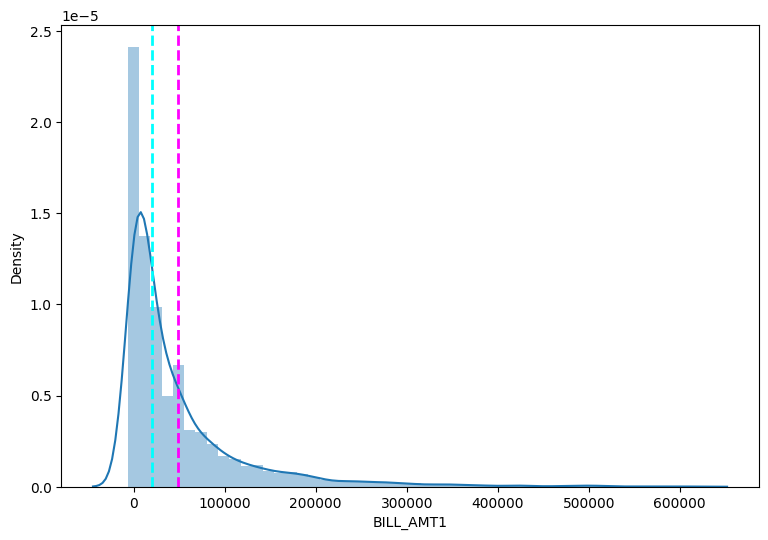

In [ ]:
# Visualizing code of hist plot for required columns to know the data distibution

fig=plt.figure(figsize=(9,6))
ax=fig.gca()
feature= (hypo_2["BILL_AMT1"])
sns.distplot(hypo_2["BILL_AMT1"])
ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
mean_median_difference=hypo_2["BILL_AMT1"].median()- hypo_2["BILL_AMT1"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- -28324.162296564195


I used T-Test as the statistical testing to get the P-Value, and the result showed that the Failed to reject the Null Hypothesis.

### Hypothetical Statement - 3

**Men not defaulting are more than or equal to 30 years of AGE.**

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 30

Alternate Hypothesis : N < 30

Test Type: Left Tailed Test

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

# SEX: 
# 1 = male; 2 = female

# Is_Defaulter:
# 0 = non-default; 1 = default

hypo_3 = df[(df['SEX']==1) & (df["Is_Defaulter"]==0)]

# Getting the required parameter values for hypothesis testing
hypothesis_number = 40
sample_mean = hypo_3["AGE"].mean()
size = len(hypo_3)
std=(variance(hypo_3["AGE"]))**0.5


In [ ]:
# Getting Z value
z = findz.mean(hypothesis_number,sample_mean,size,std)

# Getting P - Value
p = p_value(z=z,tailed='l',t="false",hypothesis_number=hypothesis_number,df=hypo_3,col="AGE")

# Getting Conclusion
print(conclusion(p))

Null Hypothesis rejected Successfully for p = 1.2867824212425077e-290


##### Which statistical test have you done to obtain P-Value?

I used Z-Test as the statistical testing to get the P-Value, and the results showed that the null hypothesis rejected, and male customers who didn't default were over 30 years old.

##### Why did you choose the specific statistical test?

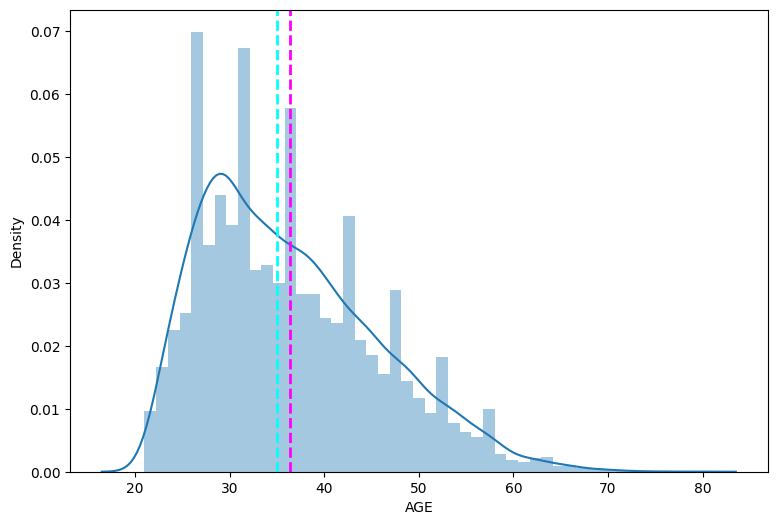

In [ ]:
# Visualizing code of hist plot for required columns to know the data distibution

fig=plt.figure(figsize=(9,6))
ax=fig.gca()
feature= (hypo_3["AGE"])
sns.distplot(hypo_3["AGE"])
ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
plt.show()

Mean and medin are nearly same and it is showing the normal disturbution that's why i use z-test to obtain p-value

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation

print(df.isnull().sum())

ID                    0
LIMIT_BAL             0
SEX                   0
EDUCATION             0
MARRIAGE              0
AGE                   0
PAY_1                 0
PAY_2                 0
PAY_3                 0
PAY_4                 0
PAY_5                 0
PAY_6                 0
BILL_AMT1             0
BILL_AMT2             0
BILL_AMT3             0
BILL_AMT4             0
BILL_AMT5             0
BILL_AMT6             0
PAY_AMT1              0
PAY_AMT2              0
PAY_AMT3              0
PAY_AMT4              0
PAY_AMT5              0
PAY_AMT6              0
Is_Defaulter          0
Sum_all_pay_amount    0
Sum_all_bill          0
dtype: int64


#### What all missing value imputation techniques have you used and why did you use those techniques?

There is no missing value in dataset

### 2. Handling Outliers

In [ ]:
# Handling Outliers & Outlier treatments
num_features = [ 'LIMIT_BAL', 'AGE', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'Sum_all_bill', 'Sum_all_pay_amount']

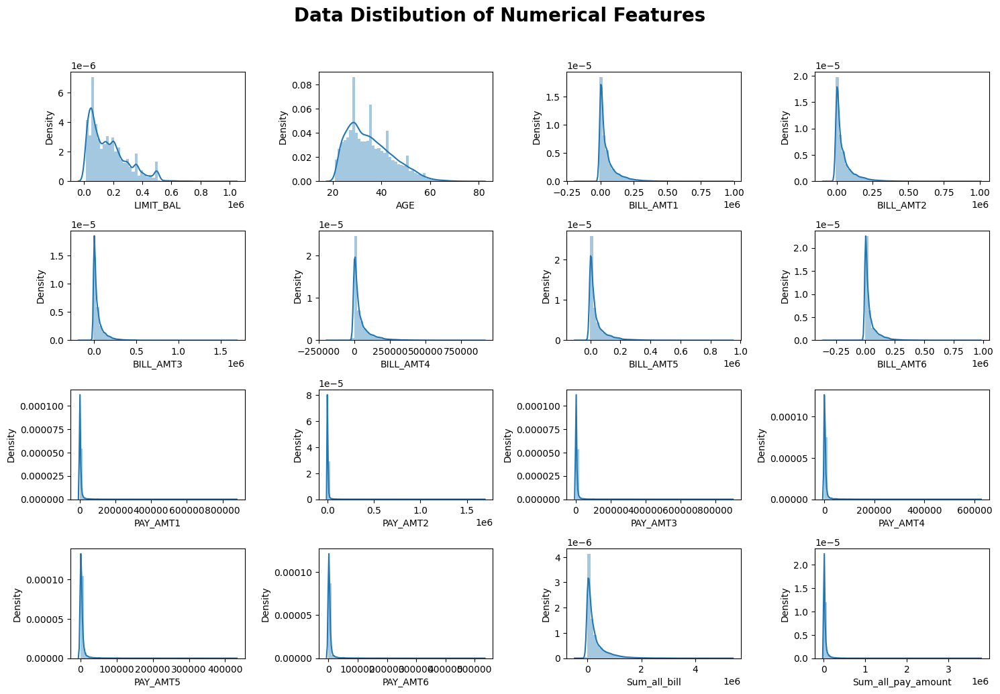

In [ ]:
plt.figure(figsize=(15,12))
# title
plt.suptitle('Data Distibution of Numerical Features', fontsize=20, fontweight='bold', y=1.02)

for i,col in enumerate(num_features):
  plt.subplot(5, 4, i+1)                       

  # dist plots
  sns.distplot(df[col])  
  # x-axis label
  plt.xlabel(col)
  plt.tight_layout()  

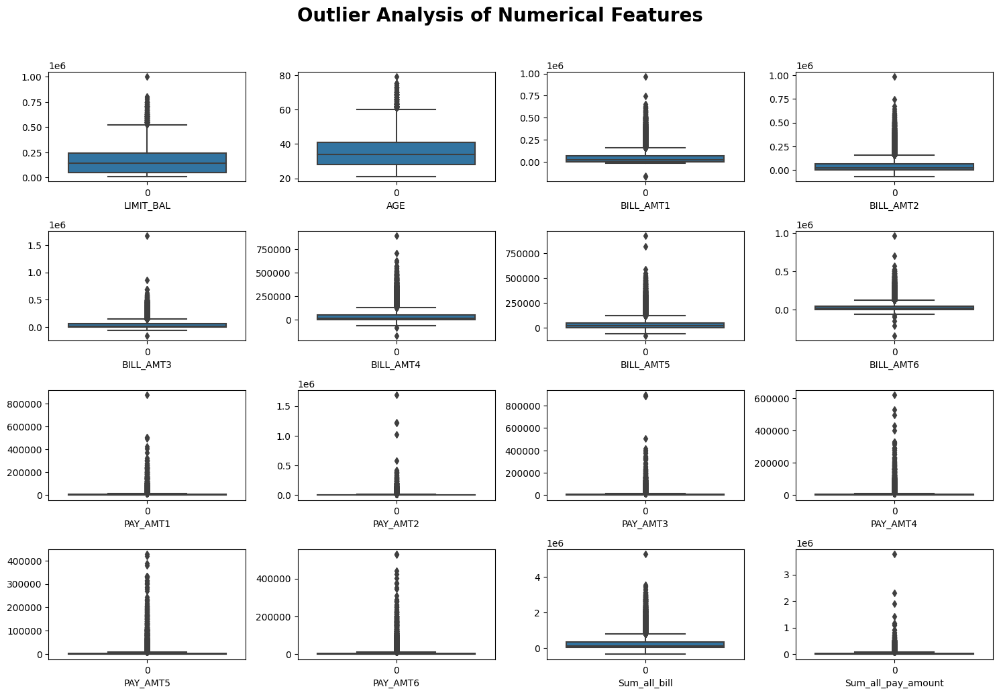

In [ ]:
# figsize
plt.figure(figsize=(15,12))
# title
plt.suptitle('Outlier Analysis of Numerical Features', fontsize=20, fontweight='bold', y=1.02)

for i,col in enumerate(num_features):
  plt.subplot(5, 4, i+1)            # subplot of 4 rows and 5 columns

  # countplot
  sns.boxplot(df[col])
  # x-axis label
  plt.xlabel(col)
  plt.tight_layout()

In [ ]:
for i in num_features:
    # Finding IQR
    Q1=df[i].quantile(0.25)
    Q3=df[i].quantile(0.75)
    IQR=Q3-Q1
    
    # Defining upper and lower limit
    lower_limit =df[i].quantile(0.25)-1.5*IQR
    upper_limit =df[i].quantile(0.75)+1.5*IQR
    
    # Applying lower and upper limit to each variables
    df.loc[(df[i] > upper_limit),i] = upper_limit
    df.loc[(df[i] < lower_limit),i] = lower_limit

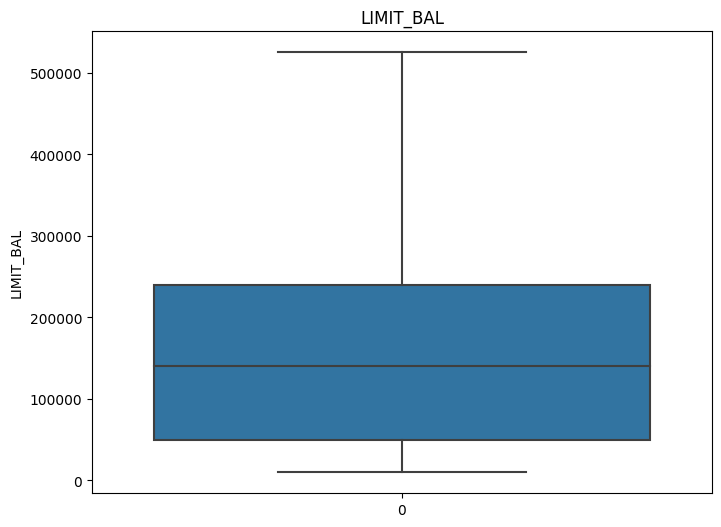

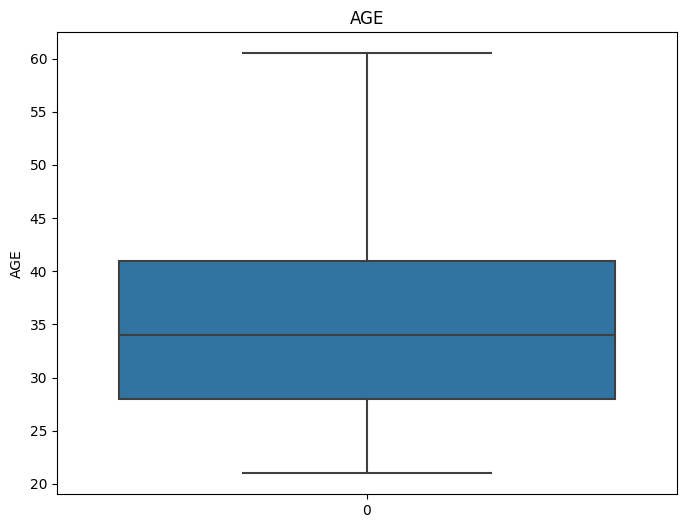

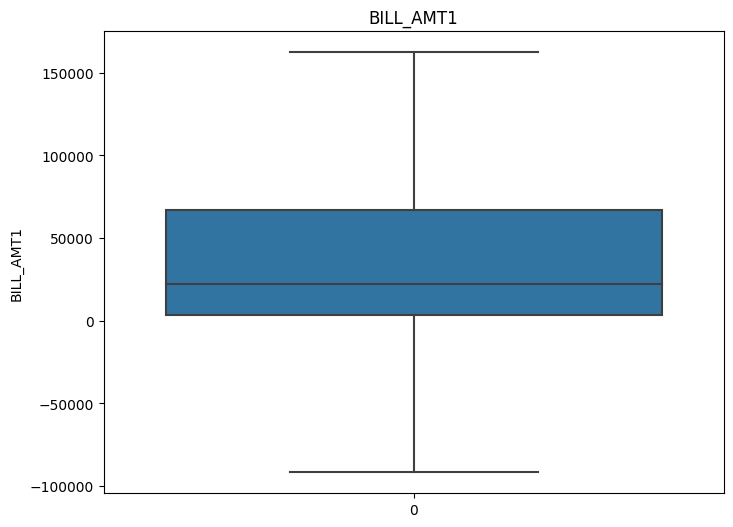

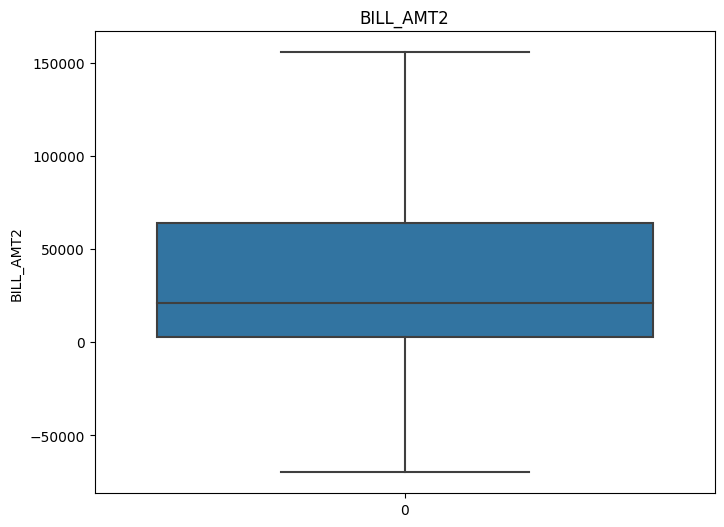

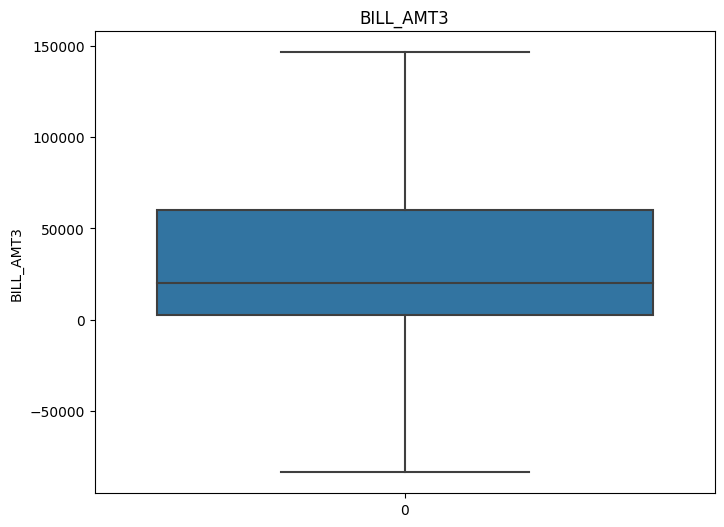

...

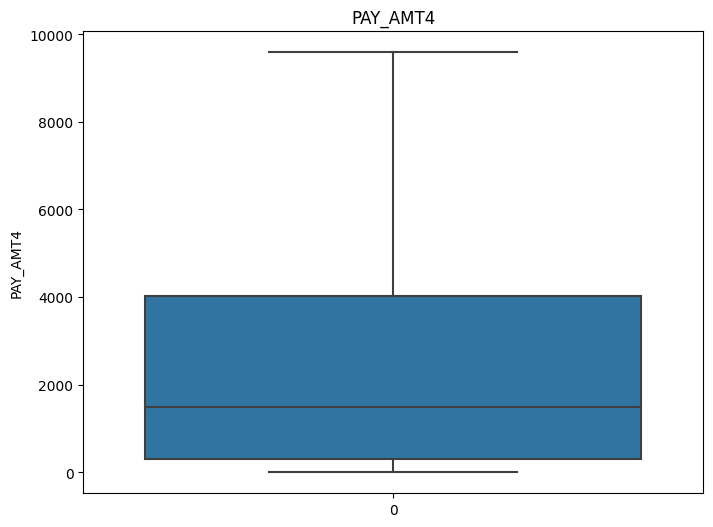

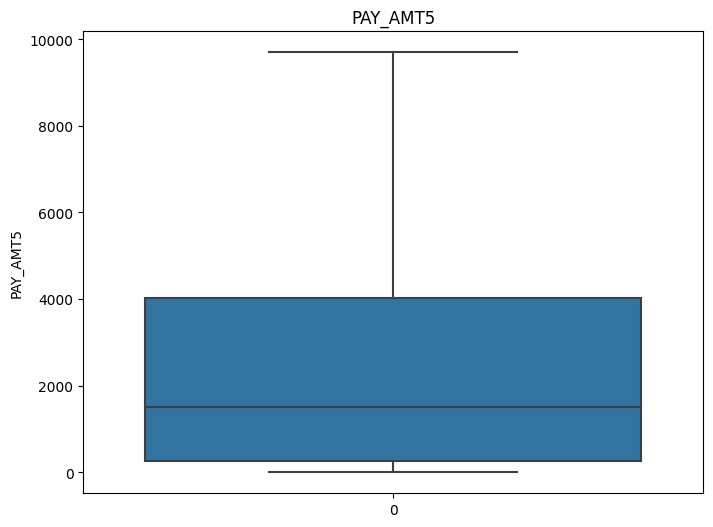

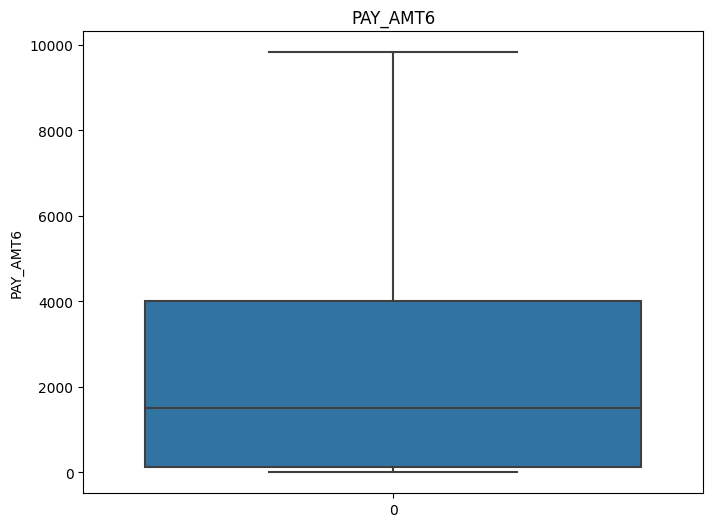

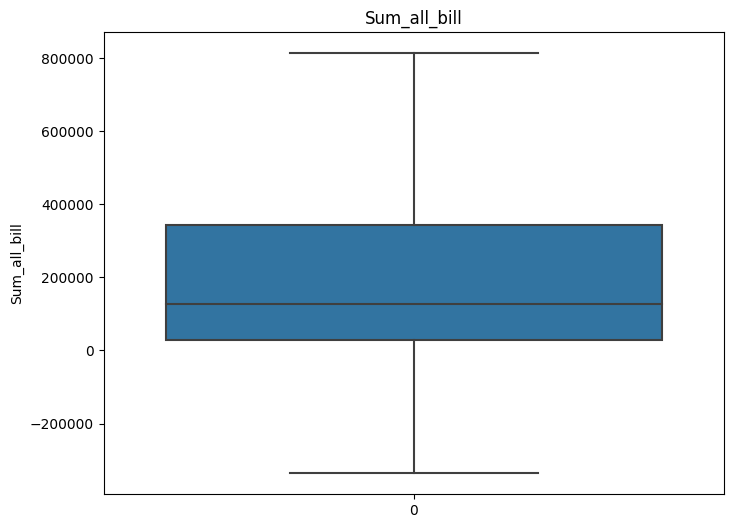

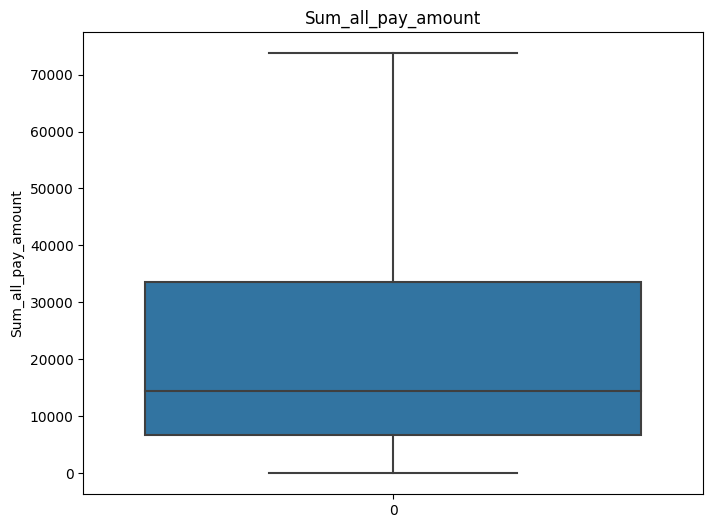

In [ ]:
for var in num_features:
    plt.subplots(figsize=(8,6))
    
    ax=sns.boxplot(data=df[var])
    ax.set_title(f'{var}')
    ax.set_ylabel(var)
  
    plt.show()

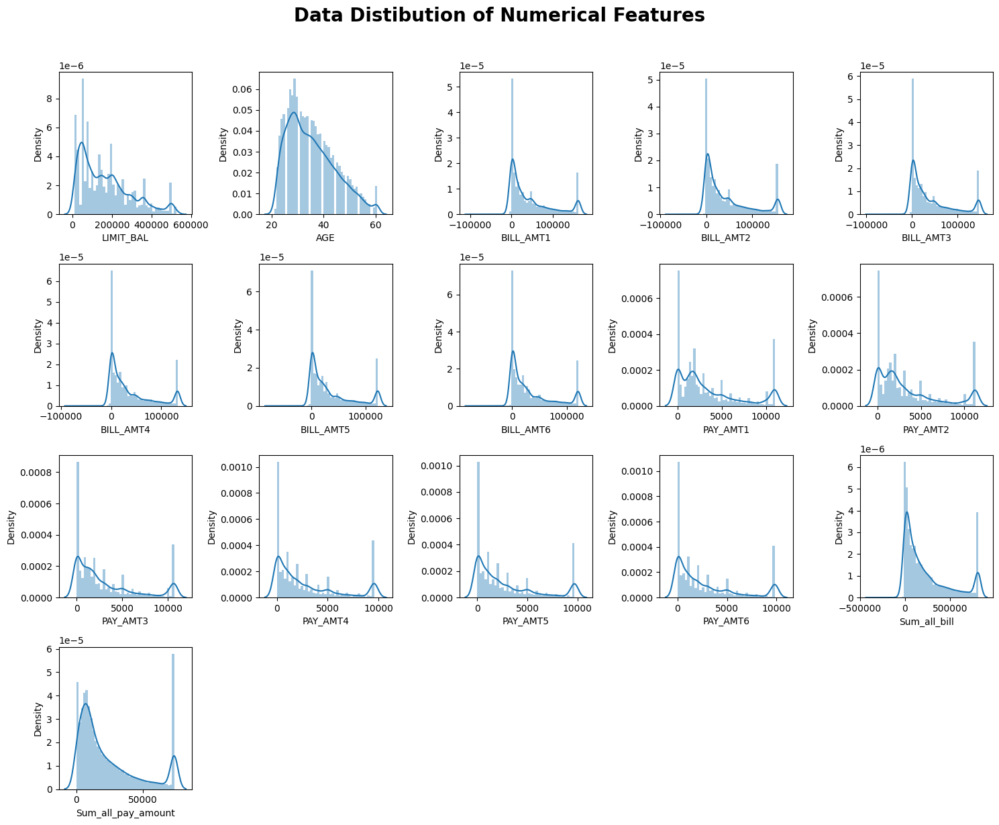

In [ ]:
plt.figure(figsize=(15,12))
# title
plt.suptitle('Data Distibution of Numerical Features', fontsize=20, fontweight='bold', y=1.02)

for i,col in enumerate(num_features):
  plt.subplot(4, 5, i+1)                       # subplots 4 rows, 5 columns

  # dist plots
  sns.distplot(df[col])  
  # x-axis label
  plt.xlabel(col)
  plt.tight_layout()  

##### What all outlier treatment techniques have you used and why did you use those techniques?

The box plot is a useful graphical display for describing the behavior of the data in the middle as well as at the ends of the distributions. The box plot uses the median and the lower and upper quartiles (defined as the 25th and 75th percentiles). If the lower quartile is Q1 and the upper quartile is Q3, then the difference (Q3 — Q1) is called the interquartile range or IQR. A box plot is constructed by drawing a box between the upper and lower quartiles with a solid line drawn across the box to locate the median.

> We define the Upper and lower boundry for respective datapoints:
* lower_limit =quantile(0.25)-1.5*IQR
* upper_limit =quantile(0.75)+1.5*IQR

### 3. Categorical Encoding

In [ ]:
new_df = df.copy()

In [ ]:
new_df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_1',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'Is_Defaulter', 'Sum_all_pay_amount', 'Sum_all_bill'],
      dtype='object')

In [ ]:
# Encode your categorical columns
cat_features = ['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6','Is_Defaulter']

In [ ]:
for i in cat_features:
  print("No. of unique values in",i,"is",df[i].nunique())

No. of unique values in SEX is 2
No. of unique values in EDUCATION is 4
No. of unique values in MARRIAGE is 4
No. of unique values in PAY_1 is 11
No. of unique values in PAY_2 is 11
No. of unique values in PAY_3 is 11
No. of unique values in PAY_4 is 11
No. of unique values in PAY_5 is 10
No. of unique values in PAY_6 is 10
No. of unique values in Is_Defaulter is 2


#### What all categorical encoding techniques have you used & why did you use those techniques?

All the categorical columns have already been encoded, we just need to convert the categorical column data type as an object or category.

In [ ]:
# Cast values in the categorical columns as type str.                 # can use astype('category') too.
new_df[cat_features] = new_df[cat_features].astype(str)

# checking the result
new_df.dtypes

ID                      int64
LIMIT_BAL               int64
SEX                    object
EDUCATION              object
MARRIAGE               object
AGE                   float64
PAY_1                  object
PAY_2                  object
PAY_3                  object
PAY_4                  object
PAY_5                  object
PAY_6                  object
BILL_AMT1             float64
BILL_AMT2             float64
BILL_AMT3             float64
BILL_AMT4             float64
BILL_AMT5             float64
BILL_AMT6             float64
PAY_AMT1                int64
PAY_AMT2              float64
PAY_AMT3              float64
PAY_AMT4              float64
PAY_AMT5                int64
PAY_AMT6              float64
Is_Defaulter           object
Sum_all_pay_amount    float64
Sum_all_bill          float64
dtype: object

### 4. Textual Data Preprocessing 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Expand Contraction

In [ ]:
# Expand Contraction

#### 2. Lower Casing

In [ ]:
# Lower Casing

#### 3. Removing Punctuations

In [ ]:
# Remove Punctuations

#### 4. Removing URLs & Removing words and digits contain digits.

In [ ]:
# Remove URLs & Remove words and digits contain digits

#### 5. Removing Stopwords & Removing White spaces

In [ ]:
# Remove Stopwords

In [ ]:
# Remove White spaces

#### 6. Rephrase Text

In [ ]:
# Rephrase Text

#### 7. Tokenization

In [ ]:
# Tokenization

#### 8. Text Normalization

In [ ]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)

##### Which text normalization technique have you used and why?

Answer Here.

#### 9. Part of speech tagging

In [ ]:
# POS Taging

#### 10. Text Vectorization

In [ ]:
# Vectorizing Text

##### Which text vectorization technique have you used and why?

Answer Here.

Not required

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:
# Manipulate Features to minimize feature correlation and create new features
new_df = new_df[new_df['BILL_AMT1'] >= 0]

In [ ]:
# dropping the ID column
new_df.drop('ID',axis = 1, inplace = True)

* drop the coloumn ID.
* Dropping all negative bil amount. It may occur due to inccorect entry or any mistakes.

#### 2. Feature Selection

In [ ]:
#Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [ ]:
calc_vif(new_df[[i for i in new_df.describe().columns if i not in ['Is_Defaulter'] ]])

,variables,VIF
0,LIMIT_BAL,3.598348
1,AGE,3.113180
2,BILL_AMT1,28.373607
3,BILL_AMT2,38.982958
4,BILL_AMT3,36.838447
5,BILL_AMT4,33.383089
6,BILL_AMT5,34.230003
7,BILL_AMT6,22.431199
8,PAY_AMT1,4.780647
9,PAY_AMT2,4.609586


In [ ]:
new_df =new_df.drop(columns=['Sum_all_bill'])

In [ ]:
calc_vif(new_df[[i for i in new_df.describe().columns ]])

,variables,VIF
0,LIMIT_BAL,3.579362
1,AGE,3.110124
2,BILL_AMT1,18.537289
3,BILL_AMT2,33.011255
4,BILL_AMT3,29.150688
5,BILL_AMT4,27.738344
6,BILL_AMT5,29.706518
7,BILL_AMT6,18.799039
8,PAY_AMT1,4.779011
9,PAY_AMT2,4.595206


In [ ]:
new_df =new_df.drop(columns=['Sum_all_pay_amount'])

In [ ]:
new_df=new_df.drop(columns=['BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6'])

In [ ]:
calc_vif(new_df[[i for i in new_df.describe().columns ]])

,variables,VIF
0,LIMIT_BAL,3.515253
1,AGE,3.105590
2,BILL_AMT1,2.537605
3,PAY_AMT1,3.684209
4,PAY_AMT2,3.546170
5,PAY_AMT3,3.307358
6,PAY_AMT4,3.239234
7,PAY_AMT5,3.219731
8,PAY_AMT6,3.079572


<Axes: >

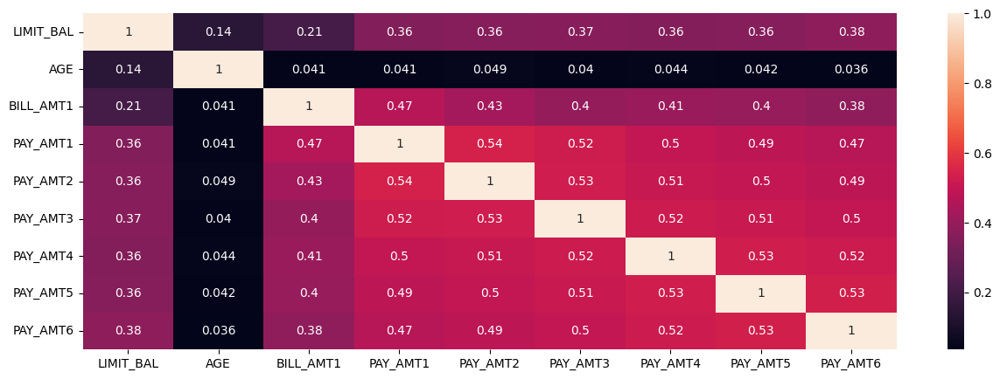

In [ ]:
plt.figure(figsize=(15,5))
sns.heatmap(new_df.corr(), annot=True)  

##### What all feature selection methods have you used  and why?

I choose VIF method to find multicollinearity among features. 

A variance inflation factor (VIF) is a measure of the amount of multicollinearity in regression analysis. Multicollinearity exists when there is a correlation between multiple independent variables in a multiple regression model. This can adversely affect the regression results. Thus, the variance inflation factor can estimate how much the variance of a regression coefficient is inflated due to multicollinearity.

##### Which all features you found important and why?

I tried to keep VIF upto 5 and for that i drop 'BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6',sum_all_bill and sum_all_pay_amount feature. I found out 18 features which are important and validate through VIF and Correlation map.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

We don't need to transform our data.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

0    22883
1     6527
Name: Is_Defaulter, dtype: int64
 


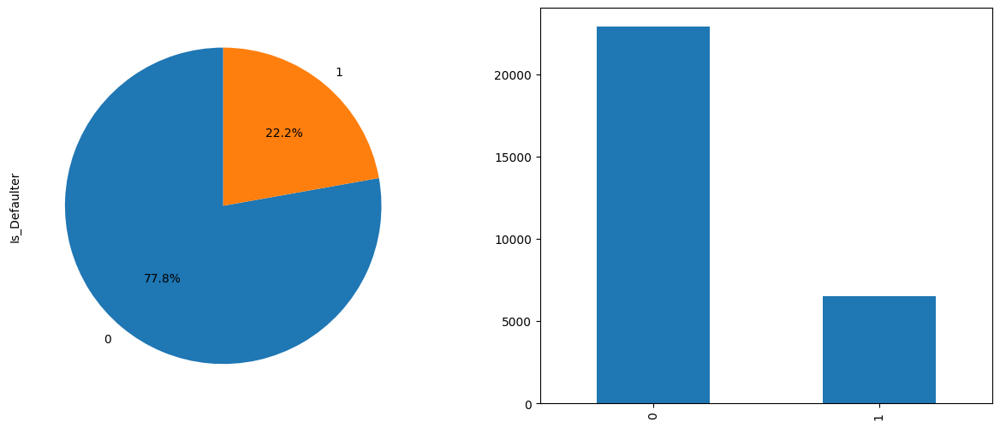

In [ ]:
# Dependant Column Value Counts
print(new_df.Is_Defaulter.value_counts())
print(" ")

# Dependant Variable Column Visualization
fig,ax = plt.subplots(1,2, figsize=(15,6))

# pie chart for percentage
new_df['Is_Defaulter'].value_counts().plot(kind='pie',autopct="%1.1f%%",startangle=90, ax=ax[0])

# bar chart for count
new_df['Is_Defaulter'].value_counts().plot(kind='bar', ax=ax[1])
plt.show()

In [ ]:
X = new_df.drop(columns='Is_Defaulter')     # independent features
y = new_df['Is_Defaulter']                  # dependent features

In [ ]:
## Handling target class imbalance using SMOTE
from collections import Counter
from imblearn.over_sampling import SMOTE


print(f'Before Handling Imbalanced class {Counter(y)}')

# Resampling the minority class
smote = SMOTE(random_state=42)

# fit predictor and target variable
X, y = smote.fit_resample(X, y)


print(f'After Handling Imbalanced class {Counter(y)}')

Before Handling Imbalanced class Counter({'0': 22883, '1': 6527})
After Handling Imbalanced class Counter({'1': 22883, '0': 22883})


##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

The data set differs significantly. Our data, therefore, lack balance. We will use the Synthetic Minority Oversampling Technique (SMOTE) to resolve this issue.

SMOTE (Synthetic Minority Oversampling Technique) works by randomly selecting a minority class point and calculating its k-nearest neighbors. Between the selected point and its neighbors, the synthetic points are added. Continue with the steps until the data is balanced.

### 6. Data Splitting

In [ ]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape)
print(X_test.shape)

(36612, 18)
(9154, 18)


##### What data splitting ratio have you used and why? 

Before, fitting any model it is a rule of thumb to split the dataset into a training and test set. This means some proportions of the data will go into training the model and some portion will be used to evaluate how our model is performing on any unseen data. The proportions may vary from 60:40, 70:30, 75:25 depending on the person but I used is 80:20 for training and testing respectively.

In this step we split our data into training and testing set using scikit learn library

### 6. Data Scaling

In [ ]:
# Scaling Data

# Initialize the scaler
scaler = StandardScaler()

# Scale the features using StandardScaler
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
     

##### Which method have you used to scale you data and why?

Standardization is a method of feature scaling in which data values are rescaled to fit the distribution between 0 and 1 using mean and standard deviation as the base to find specific values. The distance between data points is then used for plotting similarities and differences.

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Not needed.

In [ ]:
# DImensionality Reduction (If needed)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

Answer Here.

## ***7. ML Model Implementation***

### ML Model - Logistic Regression

In [ ]:
# ML Model - 1 Implementation
clf = LogisticRegression(fit_intercept=True, max_iter=10000)
# Fit the Algorithm
clf.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

In [ ]:
clf.coef_

array([[ 0.01745292, -0.05581507, -0.083852  , -0.08916182,  0.09418393,
         0.71607687,  0.0358118 ,  0.15308303,  0.04001099,  0.08592562,
         0.00531519, -0.03086546, -0.16465595, -0.14870447, -0.09083228,
        -0.05311592, -0.05509501, -0.06656517]])

In [ ]:
clf.intercept_

array([0.01753723])

In [ ]:
# Predict on the model
# Get the predicted probabilities
train_preds = clf.predict_proba(X_train)
test_preds = clf.predict_proba(X_test)

In [ ]:
# Get the predicted classes
train_class_preds = clf.predict(X_train)
test_class_preds = clf.predict(X_test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_class_preds,y_train)
test_accuracy = accuracy_score(test_class_preds,y_test)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.6848301103463346
The accuracy on test data is  0.6850557133493554


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[12867  5447]
 [ 6092 12206]]


Text(0.5, 1.0, 'Confusion Matrix')

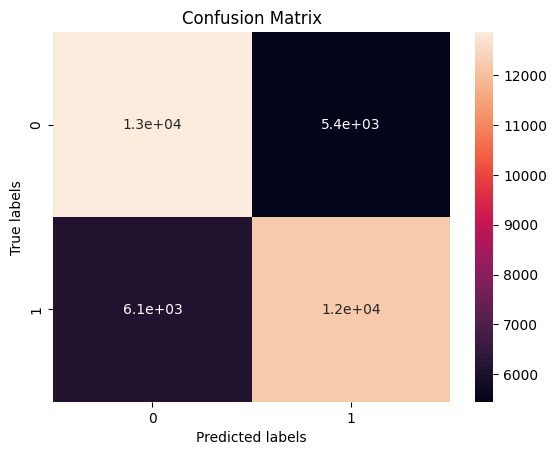

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for both train and test


cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


In [ ]:
print(metrics.classification_report(train_class_preds, y_train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_train, train_class_preds))

              precision    recall  f1-score   support

           0       0.70      0.68      0.69     18959
           1       0.67      0.69      0.68     17653

    accuracy                           0.68     36612
   macro avg       0.68      0.69      0.68     36612
weighted avg       0.69      0.68      0.68     36612

 
roc_auc_score
0.6848223511801089


In [ ]:
print(metrics.classification_report(test_class_preds, y_test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_test, test_class_preds))

              precision    recall  f1-score   support

           0       0.70      0.68      0.69      4716
           1       0.67      0.69      0.68      4438

    accuracy                           0.69      9154
   macro avg       0.69      0.69      0.68      9154
weighted avg       0.69      0.69      0.69      9154

 
roc_auc_score
0.6850828195226806


I used Logistic regression algorithm to create the model.

For training dataset, i found precision of 70% and recall of 68% and f1-score of 69% for Non-defaulter. For defaulter as I got precision of 67% and recall of 69% and f1-score of 68%. Accuracy is 68% and average percision, recall & f1_score are 68%, 69% and 68% respectively with a roc auc score of 68%.

For testing dataset, i found precision of 70% and recall of 68% and f1-score of 69% for Non defaulter. For defaulter as I got precision of 67% and recall of 69% and f1-score of 68%. Accuracy is 69% and average percision, recall & f1_score are 69%, 69% and 68% respectively with a roc auc score of 68%.

Next tryting to improving the score by using hyperparameter tuning technique.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
model = LogisticRegression(max_iter=10000)
solvers = ['lbfgs' ]
penalty = ['l2']
c_values = [1000,100, 10, 1.0, 0.1, 0.01,0.001]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X, y)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.625421 using {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
# Predict on the model
# Get the predicted classes
train_class_preds = grid_result.predict(X_train)
test_class_preds = grid_result.predict(X_test)

In [ ]:
print(metrics.classification_report(train_class_preds, y_train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_train, train_class_preds))

              precision    recall  f1-score   support

           0       0.61      0.55      0.58     20103
           1       0.51      0.56      0.53     16509

    accuracy                           0.56     36612
   macro avg       0.56      0.56      0.56     36612
weighted avg       0.56      0.56      0.56     36612

 
roc_auc_score
0.5562715797327329


In [ ]:
print(metrics.classification_report(test_class_preds, y_test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_test, test_class_preds))

              precision    recall  f1-score   support

           0       0.60      0.55      0.57      4995
           1       0.51      0.56      0.53      4159

    accuracy                           0.55      9154
   macro avg       0.55      0.55      0.55      9154
weighted avg       0.56      0.55      0.55      9154

 
roc_auc_score
0.5524068249043564


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset, i found precision of 61% and recall of 55% and f1-score of 58% for Non defaulter. For Defaulter I got precision of 51% and recall of 56% and f1-score of 53%. Accuracy is 56% and average percision, recall & f1_score are 56%, 56% and 56% respectively with a roc auc score of 56%.

Quite improvment seen as no overfitting but the scores reduced by some percentages.

For testing dataset, i found precision of 60% and recall of 55% and f1-score of 57% for Non Defaulter. For Defaulter, I got precision of 51% and recall of 56% and f1-score of 53%. Accuracy is 55% and average percision, recall & f1_score are 55%, 55% and 55% respectively with a roc auc score of 55%.

Quite improvment seen as no overfitting but the scores reduced by some percentages.

### ML Model - 2 -Random Forest Classifier

In [ ]:
# ML Model - 2 Implementation
# Create an instance of the RandomForestClassifier
rf_model = RandomForestClassifier()

# Fit the Algorithm
rf_model.fit(X_train,y_train)

# Predict on the model
# Making predictions on train and test data
train_class_preds = rf_model.predict(X_train)
test_class_preds = rf_model.predict(X_test)

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train,train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9995629848137223
The accuracy on test dataset is 0.8767751802490714


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[18306     8]
 [    8 18290]]


Text(0.5, 1.0, 'Confusion Matrix')

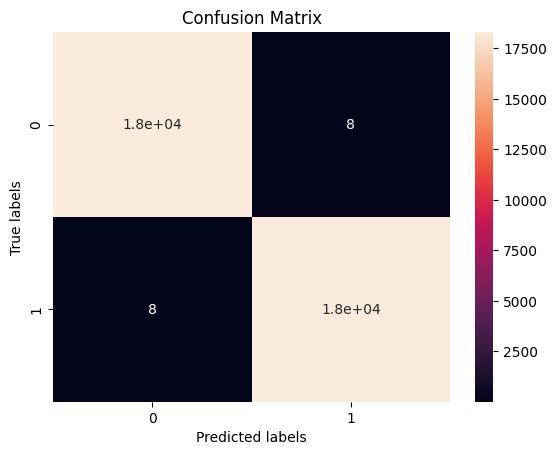

In [ ]:
# Visualizing evaluation Metric Score chart# Get the confusion matrix for both train and test

cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


[[4213  356]
 [ 772 3813]]


Text(0.5, 1.0, 'Confusion Matrix')

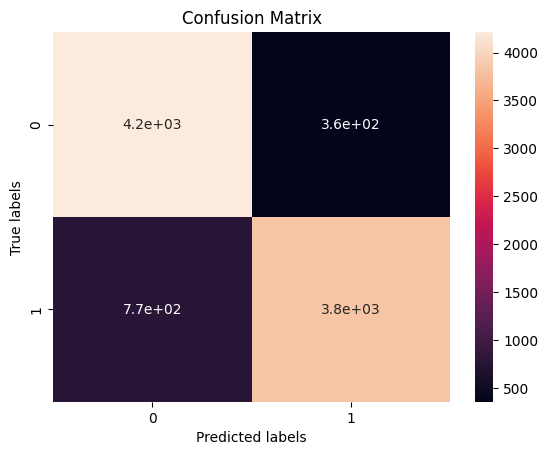

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


In [ ]:
print(metrics.classification_report(train_class_preds, y_train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_train, train_class_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     18314
           1       1.00      1.00      1.00     18298

    accuracy                           1.00     36612
   macro avg       1.00      1.00      1.00     36612
weighted avg       1.00      1.00      1.00     36612

 
roc_auc_score
0.9995629847302601


In [ ]:
print(metrics.classification_report(test_class_preds, y_test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_test, test_class_preds))

              precision    recall  f1-score   support

           0       0.92      0.85      0.88      4985
           1       0.83      0.91      0.87      4169

    accuracy                           0.88      9154
   macro avg       0.88      0.88      0.88      9154
weighted avg       0.88      0.88      0.88      9154

 
roc_auc_score
0.8768542353010531


Then, I used Random Forest algorithm to create the model.

For training dataset, i found precision of 100% and recall of 100% and f1-score of 100% for Non-Defaulter. For Defaulter, I got precision of 100% and recall of 100% and f1-score of 100%. Accuracy is 100% and average percision, recall & f1_score are 100%, 100% and 100% respectively with a roc auc score of 100%.

For testing dataset, i found precision of 92% and recall of 85% and f1-score of 88% for Non-defaulter. For Defaulter, I got precision of 83% and recall of 9%1 and f1-score of 87%. Accuracy is 88% and average percision, recall & f1_score are 88%, 88% and 88% respectively with a roc auc score of 88%.

Next tryting to improving the score by using hyperparameter tuning technique.

In [ ]:
importances = rf_model.feature_importances_

importance_dict = {'Feature' : list(X.columns),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)
importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

In [ ]:
importance_df.sort_values(by=['Feature Importance'],ascending=False)

,Feature,Feature Importance
5,PAY_1,0.15
3,MARRIAGE,0.08
6,PAY_2,0.08
1,SEX,0.07
7,PAY_3,0.06
11,BILL_AMT1,0.06
0,LIMIT_BAL,0.05
2,EDUCATION,0.05
4,AGE,0.05
12,PAY_AMT1,0.05


In [ ]:
features = X.columns
importances = rf_model.feature_importances_
indices = np.argsort(importances)

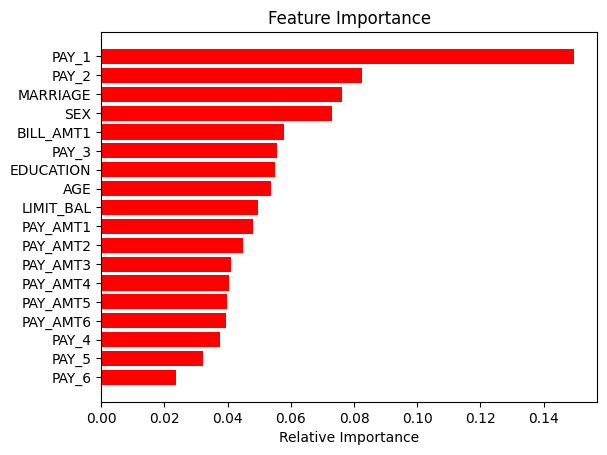

In [ ]:
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 2 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

# Create an instance of the RandomForestClassifier
rf_model = RandomForestClassifier()

# Grid search
rf_grid = GridSearchCV(estimator=rf_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2, scoring='f1')


# Fit the Algorithm
rf_grid.fit(X_train,y_train)



# Predict on the model
# Making predictions on train and test data
train_class_preds = rf_grid.predict(X_train)
test_class_preds = rf_grid.predict(X_test)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.7s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   2.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   2.3s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   3.0s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   2.5s
[CV] END max_depth=4, min_sam

In [ ]:
print("Best: %f using %s" % (rf_grid.best_score_, rf_grid.best_params_))

Best: nan using {'max_depth': 4, 'min_samples_leaf': 40, 'min_samples_split': 50, 'n_estimators': 50}


[[16051  2263]
 [ 5324 12974]]


Text(0.5, 1.0, 'Confusion Matrix')

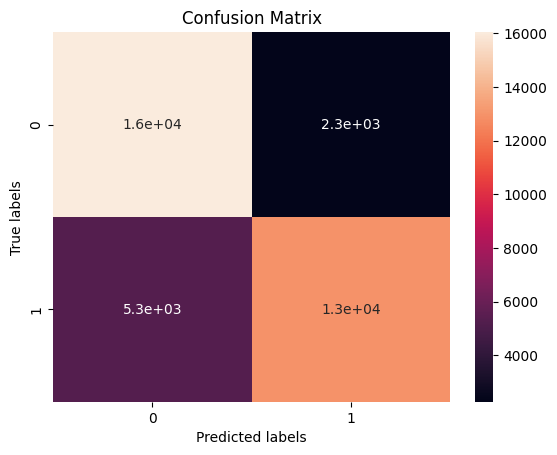

In [ ]:
# Visualizing evaluation Metric Score chart# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


[[3965  604]
 [1302 3283]]


Text(0.5, 1.0, 'Confusion Matrix')

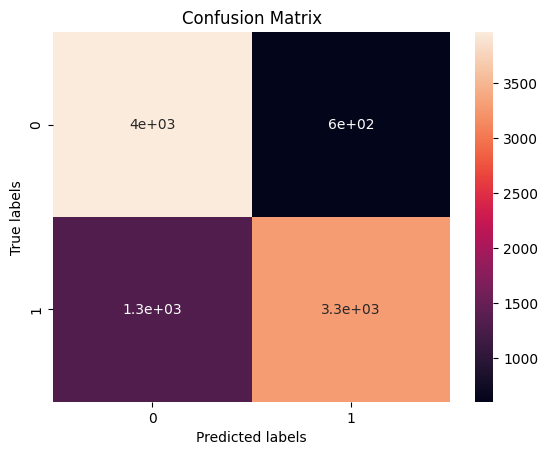

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


In [ ]:
print(metrics.classification_report(train_class_preds, y_train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_train, train_class_preds))

              precision    recall  f1-score   support

           0       0.88      0.75      0.81     21375
           1       0.71      0.85      0.77     15237

    accuracy                           0.79     36612
   macro avg       0.79      0.80      0.79     36612
weighted avg       0.81      0.79      0.79     36612

 
roc_auc_score
0.7927362844771262


In [ ]:
# Hypertuned Random Forest
print(metrics.classification_report(test_class_preds, y_test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_test, test_class_preds))

              precision    recall  f1-score   support

           0       0.87      0.75      0.81      5267
           1       0.72      0.84      0.78      3887

    accuracy                           0.79      9154
   macro avg       0.79      0.80      0.79      9154
weighted avg       0.80      0.79      0.79      9154

 
roc_auc_score
0.791917652817945


In [ ]:
rf_importances = rf_grid.best_estimator_.feature_importances_

In [ ]:
rf_importance_dict = {'Feature RF' : list(X.columns),
                   'Feature Importance RF' : rf_importances}

In [ ]:
rf_importance = pd.DataFrame(rf_importance_dict)
rf_sorting_features = rf_importance.sort_values(by=['Feature Importance RF'],ascending=False)

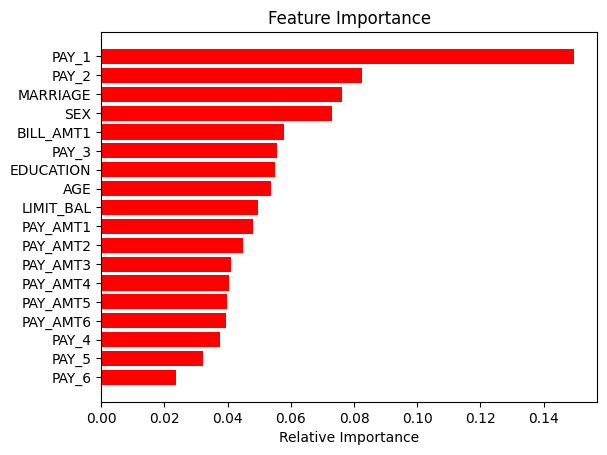

In [ ]:
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset, i found precision of 88% and recall of 75% and f1-score of 81% for Non-Defaulter. For Defaulter, I got precision of 71% and recall of 85% and f1-score of 77%. Accuracy is 79% and average percision, recall & f1_score are 79%, 80% and 79% respectively with a roc auc score of 79%.

Quite improvment seen as no overfitting but the scores reduced by some percentages.

For testing dataset, i found precision of 87% and recall of 75% and f1-score of 81% for Non-defaulter. For Defaulter, I got precision of 72% and recall of 84% and f1-score of 78%. Accuracy is 79% and average percision, recall & f1_score are 79%, 80% and 79% respectively with a roc auc score of 79%.


### ML Model - Implementing XgBoost Classifier

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test=le.fit_transform(y_test)

In [ ]:
# ML Model - 3 Implementation
# Create an instance of the RandomForestClassifier
xg_model = XGBClassifier()

# Fit the Algorithm
xg_models=xg_model.fit(X_train,y_train)

# Predict on the model
# Making predictions on train and test data

train_class_preds = xg_models.predict(X_train)
test_class_preds = xg_models.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[17762   552]
 [ 2384 15914]]


Text(0.5, 1.0, 'Confusion Matrix')

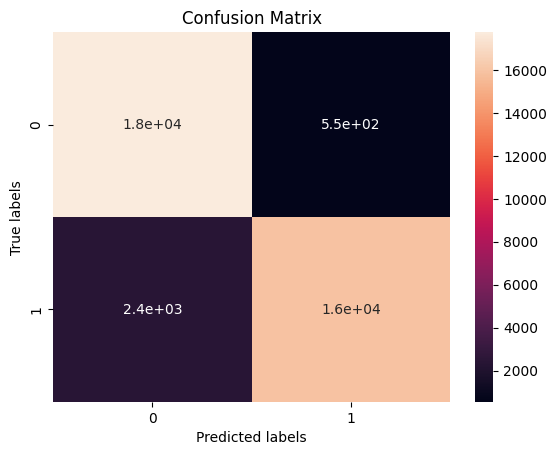

In [ ]:
# Visualizing evaluation Metric Score chart
# Visualizing evaluation Metric Score chart# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


[[4269  300]
 [ 826 3759]]


Text(0.5, 1.0, 'Confusion Matrix')

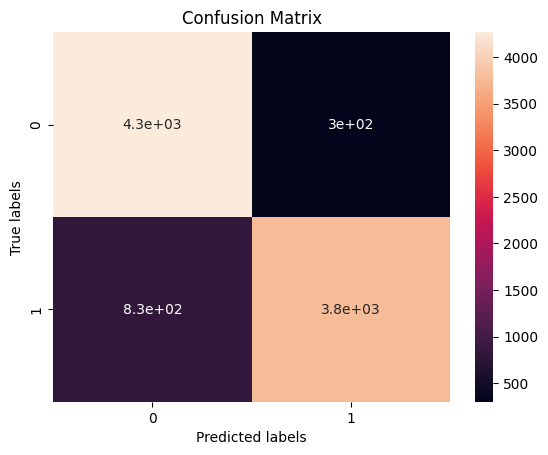

In [ ]:
# Get the confusion matrix for both train and test


cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


In [ ]:
print(metrics.classification_report(train_class_preds, y_train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_train, train_class_preds))

              precision    recall  f1-score   support

           0       0.97      0.88      0.92     20146
           1       0.87      0.97      0.92     16466

    accuracy                           0.92     36612
   macro avg       0.92      0.92      0.92     36612
weighted avg       0.92      0.92      0.92     36612

 
roc_auc_score
0.9197858305282905


In [ ]:
print(metrics.classification_report(test_class_preds, y_test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_test, test_class_preds))

              precision    recall  f1-score   support

           0       0.93      0.84      0.88      5095
           1       0.82      0.93      0.87      4059

    accuracy                           0.88      9154
   macro avg       0.88      0.88      0.88      9154
weighted avg       0.88      0.88      0.88      9154

 
roc_auc_score
0.8770937232160311


Then, I used XGBoost algorithm to create the model.

For training dataset, i found precision of 97% and recall of 88% and f1-score of 92% for Non-defaulter. For defaulter as I got precision of 87% and recall of 97% and f1-score of 92%. Accuracy is 92% and average percision, recall & f1_score are 92%, 92% and 92% respectively with a roc auc score of 92%.

For testing dataset, i found precision of 93% and recall of 84% and f1-score of 88% for Non defaulter. For defaulter as I got precision of 82% and recall of 93% and f1-score of 87%. Accuracy is 88% and average percision, recall & f1_score are 88%, 88% and 88% respectively with a roc auc score of 88%.

Next tryting to improving the score by using hyperparameter tuning technique.

In [ ]:
importances = xg_model.feature_importances_

importance_dict = {'Feature' : list(X.columns),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)
importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

importance_df.sort_values(by=['Feature Importance'],ascending=False)

features = X.columns
importances = xg_model.feature_importances_
indices = np.argsort(importances)

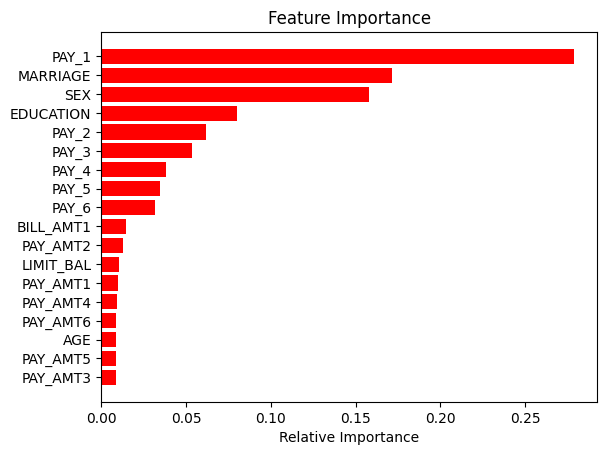

In [ ]:
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
 # ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

# Create an instance of the RandomForestClassifier
xg_model = XGBClassifier()

# Fit the Algorithm
# Grid search
xg_grid = GridSearchCV(estimator=xg_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2, scoring='roc_auc')

xg_grid1=xg_grid.fit(X_train,y_train)
# Predict on the model
# Making predictions on train and test data

train_class_preds = xg_grid1.predict(X_train)
test_class_preds = xg_grid1.predict(X_test)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[13:19:03] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   2.1s
[13:19:05] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.9s
[13:19:07] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   2.1s
[13:19:09] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.9s
[13:19:11] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_lea

In [ ]:
print("Best: %f using %s" % (xg_grid.best_score_, xg_grid.best_params_))

Best: 0.934248 using {'max_depth': 4, 'min_samples_leaf': 40, 'min_samples_split': 50, 'n_estimators': 50}


[[17352   962]
 [ 3290 15008]]


Text(0.5, 1.0, 'Confusion Matrix')

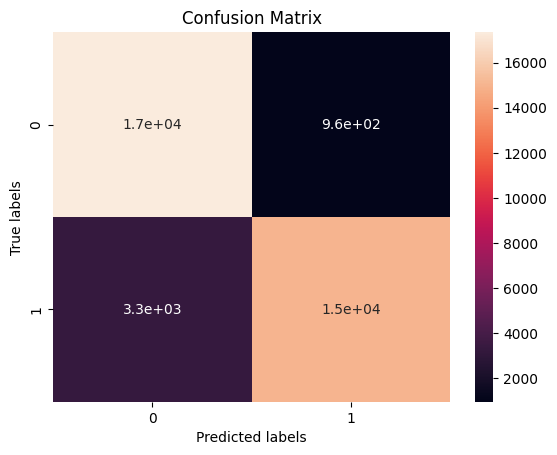

In [ ]:
# Visualizing evaluation Metric Score chart
# Visualizing evaluation Metric Score chart# Get the confusion matrix for both train and test

cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


[[4264  305]
 [ 850 3735]]


Text(0.5, 1.0, 'Confusion Matrix')

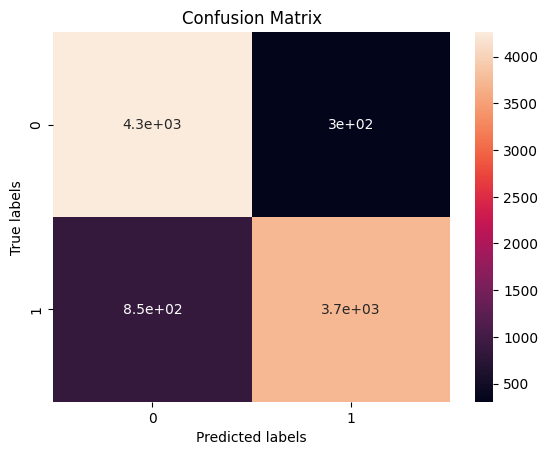

In [ ]:

cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


In [ ]:
print(metrics.classification_report(train_class_preds, y_train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_train, train_class_preds))

              precision    recall  f1-score   support

           0       0.95      0.84      0.89     20642
           1       0.82      0.94      0.88     15970

    accuracy                           0.88     36612
   macro avg       0.88      0.89      0.88     36612
weighted avg       0.89      0.88      0.88     36612

 
roc_auc_score
0.8838354041405896


In [ ]:
print(metrics.classification_report(test_class_preds, y_test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_test, test_class_preds))

              precision    recall  f1-score   support

           0       0.93      0.83      0.88      5114
           1       0.81      0.92      0.87      4040

    accuracy                           0.87      9154
   macro avg       0.87      0.88      0.87      9154
weighted avg       0.88      0.87      0.87      9154

 
roc_auc_score
0.8739293274361164


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset, i found precision of 95% and recall of 84% and f1-score of 89% for Non-defaulter. For defaulter as I got precision of 82% and recall of 94% and f1-score of 88%. Accuracy is 88% and average percision, recall & f1_score are 88%, 89% and 88% respectively with a roc auc score of 88%.

For testing dataset, i found precision of 93% and recall of 83% and f1-score of 88% for Non defaulter. For defaulter as I got precision of 81% and recall of 92% and f1-score of 87%. Accuracy is 87% and average percision, recall & f1_score are 88%, 87% and 87% respectively with a roc auc score of 87%.



### 1. Which Evaluation metrics did you consider for a positive business impact and why?

In order to avoid false negatives, we need to minimize situations where the model predicts that a customer will not default, when in reality, they do. Similarly, to minimize false positives, we need to increase the precision and recall scores, which will positively impact the f1_score. In our scenario, recall should take precedence over precision. Hence, we should aim for moderate f1_score and high recall scores.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

In [1]:
# import module
from tabulate import tabulate


# Assign data
mydata = [
    ['Logistic regression',"51","56","53",'55'],
    ['Random Forest Classifier',"74", "82", '78','79'],
    ['XGBOOST Classifier',"81", "92", '87','87']
    ]
 
# Create header for table
head = ['Precision(%)',"Recall(%)", "F1-Score(%)",'ROC-AUC(%)']
 
# display table
print(tabulate(mydata, headers=head, tablefmt="grid"))
print('Note : Highest evaluation metric are taken into consideration between train_test_split and cross validation from each model')

+--------------------------+----------------+-------------+---------------+--------------+
|                          |   Precision(%) |   Recall(%) |   F1-Score(%) |   ROC-AUC(%) |
+==========================+================+=============+===============+==============+
| Logistic regression      |             51 |          56 |            53 |           55 |
+--------------------------+----------------+-------------+---------------+--------------+
| Random Forest Classifier |             74 |          82 |            78 |           79 |
+--------------------------+----------------+-------------+---------------+--------------+
| XGBOOST Classifier       |             81 |          92 |            87 |           87 |
+--------------------------+----------------+-------------+---------------+--------------+
Note : Highest evaluation metric are taken into consideration between train_test_split and cross validation from each model


I have choosen XGBOOST Classifier because of high recall, better F1 score and ROC AUC.
from above table you can easily depict the better recall and f1 value and we found out that XGBOOST classifier has better recall, f1 and roc auc values.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

In [ ]:
!pip install shap==0.40.0
import shap 
import graphviz
sns.set_style('darkgrid') 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 371.7/371.7 kB 15.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for shap: filename=shap-0.40.0-cp310-cp310-linux_x86_64.whl size=552503 sha256=ecc5709c3ec250a24105c590cae8ece75b3e13a2df840adca8efcb85c44f2535
  Stored in directory: /root/.cache/pip/wheels/33/28/e3/62a9dc612c58c1b8d1c16fa51e64941bbb38ac8a6decbad39c
Successfully built shap


In [ ]:
#Get shap values
explainer = shap.Explainer(xg_models)
shap_values = explainer(X_test) 

In [ ]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()
# Forceplot for first observation
shap.plots.force(shap_values[0],feature_names=X.columns)


The base value: The original paper explains that the base value E(y_hat) is “the value that would be predicted if we did not know any features for the current output.” In other words, it is the mean prediction, or mean(yhat). Our basevalue is -0.28.

Red/blue: Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

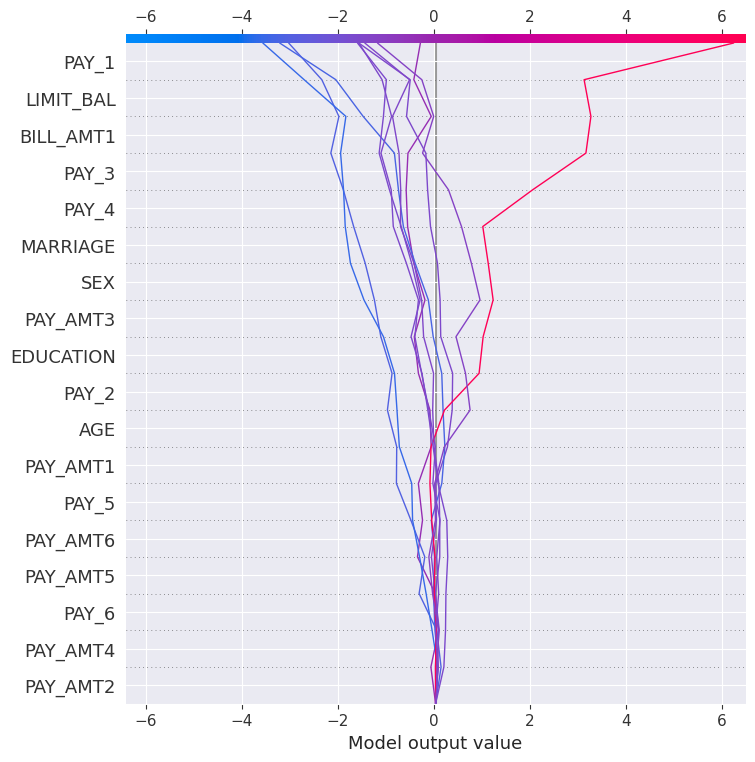

In [ ]:
# Get expected value and shap values array
expected_value = explainer.expected_value
shap_array = explainer.shap_values(X_test)

#Descion plot for first 10 observations
shap.decision_plot(expected_value, shap_array[0:10],feature_names=list(X.columns))

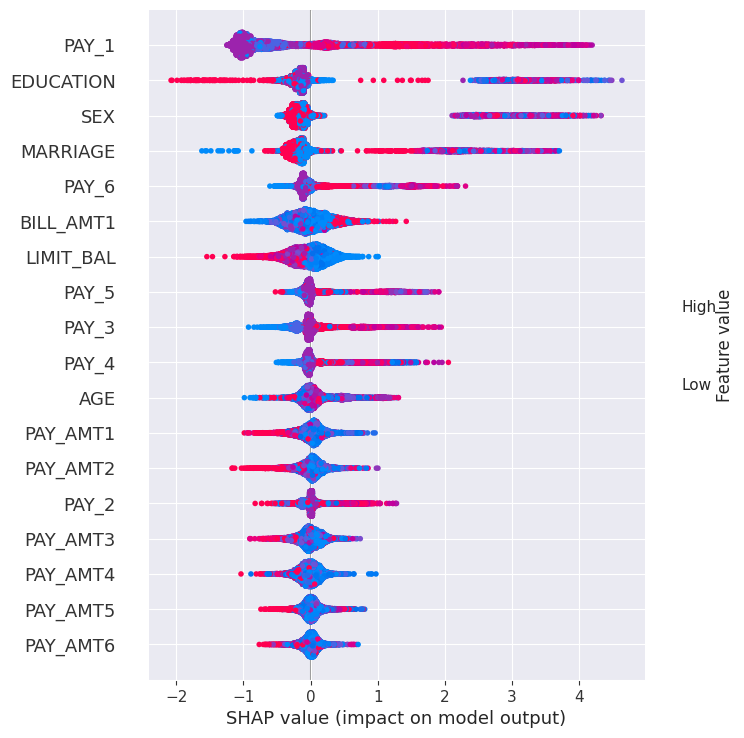

In [ ]:
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

This plot is made of all the dots in the train data. It demonstrates the following information:

Feature importance: Variables are ranked in descending order.

Impact: The horizontal location shows whether the effect of that value is associated with a higher or lower prediction.

Original value: Color shows whether that variable is high (in red) or low (in blue) for that observation.

Correlation: A high level of the "Pay_1" content has a low and Positive impact on the model. The "low" comes from the blue color, and the “positive” impact is shown on the X-axis. Similarly, we will say the “MARRIGE” has negative impact.

Red indicates a higher and blue indicates a lower . From the X-axis we can verify the impact (Positive or Negative) for that specific data.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

Here are some insights i found out by performing overall EDA and implementing machine learning algorithm:
* By percentage 22.1% of customers defaulted on their payment whereas 77.9% of customers do not default on their credit card payment. This distrubution give us hint of data imbalnce which we handle the technique called as **SMOTE**.
* More credit card defualt for limit balance about 100000. It might mean that credit card might be too easy to be issued for people who have low credit scores.
* Defaulter ratio is slmost same for both male and female but females account for using credit card more. Females are the major revenue for credit cards.
* Credit card users in University students are quite high in comparison to others but defaulter ration in comparison to total users are more in High schools.
* Both married and single credit card users are same and they also have almost same number of defaulters but in comparison to others divorce users are tend to be become more defaulter.
* Most of credit card users are belongs to 20-40 years age group. If we look carefully at ratio of defaulters who has age more than 40, ratio of defaulters are high that means old people are more prone to become defaulter.
* Although most of users paid their dues on time, there are some propertion of users who had payment dealy for 2 months and in very few numbers users had payment dealy goes for 8 or 9 months.
* There is not strong correlation between fetures except bill amounts and payment amounts. Which we handle through heatmap and by using VIF technique. This techniques also helps in selection of features.
* Handle the outliers in data by using IQR technique which helps us to define upper and lower boundry limit.
* We implement three machine learning algorithms that is Logistic regression, Random forest classifier and XGBOOST classifier.
* When implementing a machine learning model, We focused more on the Recall score and F1 score because we are dealing with credit card data and our data is unbalanced.
* After comparing all the metrices like Recall and f1 score, I found out XGBOOST classifier is most suitabe machine earning alogrithm for this business problem.

In order to avoid false negatives, we need to minimize situations where the model predicts that a customer will not default, when in reality, they do. Similarly, to minimize false positives, we need to increase the precision and recall scores, which will positively impact the f1_score. In our scenario, recall should take precedence over precision. Hence, we should aim for moderate f1_score and high recall scores.

**XGBOOST classifier give 92% of Recall and 87% of F1 score and with ROC AUC of 87%.**

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***